In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import tensorflow as tf
import keras
import pysindy as ps
import numpy.matlib
import mat73
import colorcet as cc
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

from numpy import asarray
from scipy import stats, signal, io
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import Lasso, LassoCV
from sklearn.ensemble import BaggingRegressor
from keras import regularizers
from keras.models import Sequential
from keras.layers import Dense, Dropout, Input, Layer
from matplotlib.animation import FuncAnimation, FFMpegWriter

%matplotlib notebook

2023-05-09 19:11:41.094664: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-09 19:11:42.117235: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-05-09 19:11:42.117276: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-05-09 19:11:42.261080: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-05-09 19:11:44.363071: W tensorflow/stream_executor/platform/de

In [2]:
def tic():
    import time
    global startTime_for_tictoc
    startTime_for_tictoc = time.time()

def toc():
    import time
    if 'startTime_for_tictoc' in globals():
        print("Elapsed time is " + str(time.time() - startTime_for_tictoc) + " seconds.")
    else:
        print("Toc: start time not set")
        
def scaler(data_in, scaler_in = None):
    
    data_in = StandardScaler(with_std=False).fit_transform(data_in)

    if scaler_in is None:
        scaler_in = MinMaxScaler(feature_range=(-1, 1))
        scaler_in.fit(data_in)
        
    x = scaler_in.transform(data_in)
    #x = StandardScaler(with_std=False).fit_transform(x)
    
    return x, scaler_in

def hankel_matrix(Xin, n_delay_coordinates, spacing=1):
    n_inputs, n_samples = Xin.shape

    X = np.zeros((n_inputs * (n_delay_coordinates), n_samples - spacing*(n_delay_coordinates-1)))
    for i in range(n_delay_coordinates):
        idxs = np.arange(spacing*i, spacing*(i+1) + n_samples - spacing*n_delay_coordinates)
        X[i*n_inputs:(i+1)*n_inputs] = Xin[:, idxs]
    return X

def true_polys(rows, dt, r, center): 
    m = rows // 2
    Ut = np.linspace(-m*dt, m*dt, rows)
    poly_stack = []
    for j in range(r):
        if (center):
            poly_stack.append(Ut ** (j + 1))
        else: 
            poly_stack.append(Ut ** j)
    poly_stack = np.vstack(poly_stack).T
    Q = np.empty((rows, r)) # Perform Gram-Schmidt
    for j in range(r): 
        v = poly_stack[:, j]
        for k in range(j - 1): 
            r_jk = Q[:, k].T @ poly_stack[:, j]
            v -= (r_jk * Q[:, k])
        r_jj = np.linalg.norm(v)
        Q[:, j] = v / r_jj
    return Q

def SVD_projection(data, rank=10):
    u, s, vh = np.linalg.svd(data, full_matrices=False)
    return vh[:rank,:]


In [3]:
def linear_regression(xtrain,ytrain):
    
    from sklearn.linear_model import LinearRegression

    L = LinearRegression()
    L.fit(xtrain,ytrain)
    ytrain_hat = L.predict(xtrain)
    r_squared = r2_score(ytrain, ytrain_hat, multioutput='variance_weighted')
    
    return r_squared, L

def SINDy_mapping(xtrain, ytrain, poly_order=3, alpha_in=.0001):

    lib = ps.PolynomialLibrary(degree=poly_order).fit(xtrain)
    Xi = lib.transform(xtrain)
    L = Lasso(alpha=alpha_in, max_iter=1000)
    L = BaggingRegressor(base_estimator=L, n_estimators=20, max_samples=.2, random_state=0)
    L.fit(Xi,ytrain)

    ytrain_hat = L.predict(Xi)
    r_squared = r2_score(ytrain, ytrain_hat, multioutput='variance_weighted')
    
    return r_squared, lib, L

def MLP_predict(xtrain, ytrain, activation_in='tanh', alpha_in=.001):

    alpha = alpha_in
    in_dim = xtrain.shape[1]
    out_dim = ytrain.shape[1]
    model = Sequential()
    model.add(Dense(in_dim, input_dim=in_dim, activation=activation_in, activity_regularizer=regularizers.L2(l2=alpha), kernel_initializer='he_uniform'))
    model.add(Dense(in_dim*2, activation=activation_in, activity_regularizer=regularizers.L2(l2=alpha), kernel_initializer='he_uniform'))
    model.add(Dense(out_dim, activation='linear', activity_regularizer=regularizers.L2(l2=alpha), kernel_initializer='he_uniform'))
    model.add(Dropout(.1))

    opt = keras.optimizers.Adam(learning_rate=.001)
    model.compile(loss='mse', optimizer=opt)
    model.fit(xtrain, ytrain, epochs=500, batch_size=1000, verbose=0, validation_data=(xtrain[:-1000,:],ytrain[:-1000,:]))
    
    r_squared = r2_score(ytrain, model.predict(xtrain), multioutput = 'variance_weighted')
    
    return r_squared, model

def knn_regress(xtrain, ytrain, n_neighbors=5, weights='distance'):
    
    from sklearn import neighbors
    knn = neighbors.KNeighborsRegressor(n_neighbors, weights=weights)
    model = knn.fit(xtrain, ytrain)
        
    r_squared = r2_score(ytrain, model.predict(xtrain), multioutput = 'variance_weighted')
    
    return r_squared, model

In [4]:
def AE(xtrain, ytrain):
    
    from keras.layers.core import Activation
    from keras.utils.generic_utils import get_custom_objects
    from keras import backend as K
    from keras.layers import Concatenate
    
    def custom_activation(x):
        return (K.sin(x))
    get_custom_objects().update({'custom_activation': Activation(custom_activation)})
    
    input_dim = xtrain.shape[1]
    output_dim = ytrain.shape[1]
    encoding_dim = 3
    input_data = keras.Input(shape=(input_dim,))
    
    
    #encoded_1 = Dense(encoding_dim-1, activation='tanh')(input_data)
    #encoded_2 = Dense(1, activation='custom_activation')(input_data)
    #encoded = Concatenate(axis=-1)([encoded_1, encoded_2])
    
    encoded = Dense(encoding_dim, activation='tanh')(input_data)
    #decoded = Dense(encoding_dim*2, activation='tanh', activity_regularizer=regularizers.L2(l2=.0001))(encoded)
    decoded = Dense(output_dim, activation='linear')(encoded)

    model = keras.Model(input_data, decoded)
    opt = keras.optimizers.Adam(learning_rate=.2)
    model.compile(optimizer=opt, loss='mse')

    encoder = keras.Model(input_data, encoded)
    decoder = keras.Model(encoded, decoded)

    model.fit(xtrain, ytrain, epochs=200, batch_size=2000)

    r_squared = r2_score(ytrain, model.predict(xtrain), multioutput = 'variance_weighted')

    return r_squared, model, encoder


In [55]:
def VAE(xtrain, ytrain, latent_dim=8, beta=.1, num_epochs=200):
    
    from keras import backend as K
    from keras import layers
        
    input_dim = xtrain.shape[1]
    output_dim = ytrain.shape[1]
    latent_dim = latent_dim
    input_data = keras.Input(shape=(input_dim,))
    
    class Sampling(Layer):
        """Uses (z_mean, z_log_var) to sample z"""

        def call(self, inputs):
            z_mean, z_log_var = inputs
            batch = tf.shape(z_mean)[0]
            dim = tf.shape(z_mean)[1]
            epsilon = K.random_normal(shape=(batch, dim))
            return z_mean + tf.exp(0.5 * z_log_var) * .01*epsilon
    
    encoded = Dense(latent_dim, activation='tanh')(input_data)
    z_mean = Dense(latent_dim, name="z_mean")(encoded)
    z_log_var = Dense(latent_dim, name="z_log_var")(encoded)
    z = Sampling()([z_mean, z_log_var])
    latent_inputs = keras.Input(shape=(latent_dim,))
    decoded = Dense(10, activation='tanh')(latent_inputs)
    #decoded = Dense(latent_dim*6, activation='tanh')(latent_inputs)
    decoded = Dense(output_dim, activation='linear')(decoded)
    
    
    # 2d conv
    # Reshape the input data into a 2D tensor with shape (batch_size, height, width, channels)
    #decoded = layers.Reshape((2, 2, 1))(latent_inputs)

    # The convolutional layers
    #decoded = layers.Conv2DTranspose(10, (2, 2), strides=(2, 2), padding='same', activation='tanh')(decoded)
    #decoded = layers.Flatten()(decoded)
    #decoded = Dense(output_dim, activation='linear')(decoded)    
    
    encoder = keras.Model(input_data, [z_mean, z_log_var, z], name="encoder")
    decoder = keras.Model(latent_inputs, decoded, name="decoder")
    
    
    class VAE(keras.Model):
        def __init__(self, encoder, decoder, **kwargs):
            super(VAE, self).__init__(**kwargs)
            self.encoder = encoder
            self.decoder = decoder
            self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
            self.reconstruction_loss_tracker = keras.metrics.Mean(
                name="reconstruction_loss"
            )
            self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

        @property
        def metrics(self):
            return [
                self.total_loss_tracker,
                self.reconstruction_loss_tracker,
                self.kl_loss_tracker,
            ]

        def train_step(self, data):
            
            data1, data2 = data
            
            with tf.GradientTape() as tape:
                
                z_mean, z_log_var, z = self.encoder(data1)
                
                reconstruction = self.decoder(z)
                reconstruction_loss = K.mean(keras.losses.mse(data2, reconstruction))

                kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
                kl_loss = K.mean(kl_loss)
                
                total_loss = reconstruction_loss + beta*kl_loss
                
            grads = tape.gradient(total_loss, self.trainable_weights)
            self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
            self.total_loss_tracker.update_state(total_loss)
            self.reconstruction_loss_tracker.update_state(reconstruction_loss)
            self.kl_loss_tracker.update_state(kl_loss)
            return {
                "loss": self.total_loss_tracker.result(),
                "reconstruction_loss": self.reconstruction_loss_tracker.result(),
                "kl_loss": self.kl_loss_tracker.result(),
            }
        
        def predict(self, data):
            z_mean,_,_ = self.encoder(data)
            decoded = self.decoder(z_mean)
            return decoded
            
    vae = VAE(encoder, decoder)
    opt = keras.optimizers.Adam(learning_rate=.1)
    vae.compile(optimizer=opt)
    vae.fit(xtrain, ytrain, epochs=num_epochs, batch_size=1000)
        
    r_squared = r2_score(ytrain, vae.predict(xtrain), multioutput = 'variance_weighted')

    return r_squared, vae, encoder, decoder

In [6]:
def VAE_mm(xtrain, ytrain1, ytrain2, ytrain3, latent_dim=8, beta=.1):
    
    from keras import backend as K
    from keras import layers
        
    input_dim = xtrain.shape[1]
    output_dim = ytrain.shape[1]
    latent_dim = latent_dim
    input_data = keras.Input(shape=(input_dim,))
    
    class Sampling(Layer):
        """Uses (z_mean, z_log_var) to sample z"""

        def call(self, inputs):
            z_mean, z_log_var = inputs
            batch = tf.shape(z_mean)[0]
            dim = tf.shape(z_mean)[1]
            epsilon = K.random_normal(shape=(batch, dim))
            return z_mean + tf.exp(0.5 * z_log_var) * .01*epsilon
    
    encoded = Dense(latent_dim, activation='tanh')(input_data)
    z_mean = Dense(latent_dim, name="z_mean")(encoded)
    z_log_var = Dense(latent_dim, name="z_log_var")(encoded)
    z = Sampling()([z_mean, z_log_var])
    latent_inputs = keras.Input(shape=(latent_dim,))
    
    decoded1 = Dense(latent_dim*3, activation='tanh')(latent_inputs)
    decoded1 = Dense(output_dim, activation='linear')(decoded1)
    
    decoded2 = Dense(latent_dim*3, activation='tanh')(latent_inputs)
    decoded2 = Dense(output_dim, activation='linear')(decoded2)
    
    decoded3 = Dense(latent_dim*3, activation='tanh')(latent_inputs)
    decoded3 = Dense(output_dim, activation='linear')(decoded3)
    
    
    # 2d conv
    # Reshape the input data into a 2D tensor with shape (batch_size, height, width, channels)
    #decoded = layers.Reshape((latent_dim-2, latent_dim-2, 1))(latent_inputs)

    # The convolutional layers
    #decoded = layers.Conv2DTranspose(10, (2, 2), strides=(2, 2), padding='same', activation='tanh')(decoded)
    #decoded = layers.Flatten()(decoded)
    #decoded = Dense(output_dim, activation='linear')(decoded)    
    
    encoder = keras.Model(input_data, [z_mean, z_log_var, z], name="encoder")
    decoder1 = keras.Model(latent_inputs, decoded1, name="decoder1")
    decoder2 = keras.Model(latent_inputs, decoded2, name="decoder2")
    decoder3 = keras.Model(latent_inputs, decoded3, name="decoder3")
    
    
    class VAE_mm(keras.Model):
        def __init__(self, encoder, decoder1, decoder2, decoder3, **kwargs):
            super(VAE, self).__init__(**kwargs)
            self.encoder = encoder
            self.decoder1 = decoder1
            self.decoder2 = decoder2
            self.decoder3 = decoder3

            self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
            self.reconstruction_loss_tracker = keras.metrics.Mean(
                name="reconstruction_loss"
            )
            self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

        @property
        def metrics(self):
            return [
                self.total_loss_tracker,
                self.reconstruction_loss_tracker,
                self.kl_loss_tracker,
            ]

        def train_step(self, data):
            
            data0, data1, data2, data3 = data
            
            with tf.GradientTape() as tape:
                
                z_mean, z_log_var, z = self.encoder(data1)
                
                reconstruction1 = self.decoder1(z)
                reconstruction_loss1 = tf.reduce_mean(keras.losses.mse(data1, reconstruction1),0)
                reconstruction2 = self.decoder2(z)
                reconstruction_loss2 = tf.reduce_mean(keras.losses.mse(data2, reconstruction2),0)
                reconstruction3 = self.decoder3(z)
                reconstruction_loss3 = tf.reduce_mean(keras.losses.mse(data3, reconstruction3),0)
                
                reconstruction_loss = reconstruction_loss1 + reconstruction_loss2 + reconstruction_loss3

                kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
                kl_loss = tf.reduce_mean(kl_loss,0)
                
                total_loss = reconstruction_loss + beta*kl_loss
                
            grads = tape.gradient(total_loss, self.trainable_weights)
            self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
            self.total_loss_tracker.update_state(total_loss)
            self.reconstruction_loss_tracker.update_state(reconstruction_loss)
            self.kl_loss_tracker.update_state(kl_loss)
            return {
                "loss": self.total_loss_tracker.result(),
                "reconstruction_loss": self.reconstruction_loss_tracker.result(),
                "kl_loss": self.kl_loss_tracker.result(),
            }
        
        def predict(self, data):
            z_mean,_,_ = self.encoder(data)
            decoded = self.decoder(z_mean)
            return decoded
            
    vae = VAE(encoder, decoder)
    opt = keras.optimizers.Adam(learning_rate=.02)
    vae.compile(optimizer=opt)
    vae.fit(xtrain, ytrain, epochs=200, batch_size=1000)
        
    r_squared = r2_score(ytrain, vae.predict(xtrain), multioutput = 'variance_weighted')

    return r_squared, vae, encoder, decoder

In [6]:
def CAE(xtrain, ytrain):
    
    from keras.layers.core import Activation
    from keras.utils.generic_utils import get_custom_objects
    from keras import backend as K
    from keras.layers import Concatenate
    import keras.layers as layers
       
    input_dim = xtrain.shape[1]
    encoding_dim = 4
    input_data = keras.Input(shape=(input_dim,))
    
    temp = np.zeros((ytrain.shape[0],16384), dtype=np.single)
    temp[:,mask_long] = ytrain
    ytrain = temp.reshape(ytrain.shape[0],128,128)
    del temp
    
    encoded = Dense(encoding_dim, activation='tanh')(input_data)    

    # Decoder
    Y = layers.Reshape((2, 2, 1))(encoded)
    Y = layers.Conv2DTranspose(8, (10, 10), strides=4, activation="tanh", padding="same")(Y)
    Y = layers.Conv2DTranspose(8, (10, 10), strides=16, activation="linear", padding="same")(Y)
    decoded = layers.Conv2D(1, (10, 10), activation="linear", padding="same")(Y)
    #decoded = decoded[:,mask_long]

    model = keras.Model(input_data, decoded)
    opt = keras.optimizers.Adam(learning_rate=.2)
    model.compile(optimizer=opt, loss='mse')

    encoder = keras.Model(input_data, encoded)
    decoder = keras.Model(encoded, decoded)

    model.fit(xtrain, ytrain, epochs=50, batch_size=500)

    r_squared = r2_score(ytrain, model.predict(xtrain), multioutput = 'variance_weighted')

    return r_squared, model, encoder

In [5]:
data_dir = '/home/ryraut/code/arousal'
mask = io.loadmat(data_dir+'/newmask.mat')
mask = mask["newmask"]
mask.dtype = bool
mask_long = mask.reshape(16384,order='F')
allen_ccf = mat73.loadmat(data_dir + '/allen_ccf_overlay.mat')['allen_ccf']

In [6]:
s = 1

#data_dir = '/mnt/d/raichle/outputs'
data_dir = '/home/ryraut/code/arousal/outputs'

data_dict = mat73.loadmat(data_dir + '/' + str(s) + '_pupil.mat')
pupil = data_dict['pupil'].reshape(-1,1)
data_dict = mat73.loadmat(data_dir + '/' + str(s) + '_jrgeco.mat')
brain = data_dict['data'][:,mask_long]
data_dict = mat73.loadmat(data_dir + '/' + str(s) + '_face.mat')
face = data_dict['face'].reshape(-1,1)

pupil = pupil[800:,:]
brain = brain[800:,:]
face = face[800:,:]


In [334]:
data_dir = '/home/ryraut/code/arousal/outputs'

Fs = 20
dt = 1/Fs
stackmax = 100
spacing = 4
r = 10
nsamples = 6000
alpha = .001
beta = .1
z_n = 1
polys = true_polys(stackmax, 1/Fs, r, center=False)

lag = 1 # in seconds
lag = lag*Fs*spacing

subjects = np.arange(1,10)
subjects = np.delete(subjects, [1, 2])

subjects = subjects[:4]
scores = np.zeros([len(subjects),8])

for s in range(len(subjects)):
    
    tic()
    
    subj = subjects[s]

    # Load data
    data_dict = mat73.loadmat(data_dir + '/' + str(subj) + '_pupil.mat')
    pupil = data_dict['pupil'].reshape(-1,1)
    #data_dict = mat73.loadmat(data_dir + '/' + str(subj) + '_face.mat')
    #face = data_dict['face'].reshape(-1,1)
    data_dict = mat73.loadmat(data_dir + '/' + str(subj) + '_jrgeco.mat')
    brain = data_dict['data'][:,mask_long]
    pupil = pupil[800:,:]
    brain = brain[800:,:]
    #face = face[800:,:]
    
    ## Preprocess
    sos = signal.butter(2, [.01,.2],btype = 'bandpass', output = 'sos', fs = Fs)
    pupil = signal.sosfiltfilt(sos, pupil, axis = 0)
    brain = signal.sosfiltfilt(sos, brain, axis = 0)
    #face = signal.sosfiltfilt(sos, face, axis = 0)
    
    ## DELAY EMBED
    Hp = hankel_matrix(pupil.T,stackmax,spacing)
    #Hpu, Hps, Hpvh = np.linalg.svd(Hp, full_matrices=False)

    yproj = brain[spacing*(stackmax-1):,:]

    #xtrain = (np.diag(Hps[:r])@Hpvh[:r,:nsamples]).T
    xtrain = (polys.T@Hp[:,:nsamples]).T

    ytrain = yproj[:nsamples,:]
    
    xtrain, scale_x = scaler(xtrain)
    ytrain, scale_y = scaler(ytrain)
    
    xtrain = xtrain[lag:,:]
    ytrain = ytrain[:-lag,:]
    
    #scores[s,0], lib, L = SINDy_mapping(xtrain, ytrain, 3, alpha)
    #scores[s,0], model = MLP_predict(xtrain, ytrain)
    scores[s,0], model, encoder, decoder = VAE(xtrain, ytrain, latent_dim=z_n, beta=beta)
    
        
    # HELD OUT DATA
    nsamples2 = nsamples + 1000
    #xtest = (np.diag(Hps[:r])@Hpvh[:r,nsamples2:]).T
    xtest = (polys.T@Hp[:,nsamples2:]).T
    ytest = yproj[nsamples2:,:]
    
    # SINDy validation test
    xtest,_ = scaler(xtest, scale_x)
    ytest,_ = scaler(ytest, scale_y)
    
    xtest = xtest[lag:,:]
    ytest = ytest[:-lag,:]
    ytest = scale_y.inverse_transform(ytest)

    #Xi = lib.transform(xtest)
    #ytest_hat = L.predict(Xi)
    ytest_hat = model.predict(xtest)
    ytest_hat = scale_y.inverse_transform(ytest_hat)
    scores[s,1] = r2_score(ytest, ytest_hat, multioutput = 'variance_weighted')
    scores[s,2], model, encoder, decoder = VAE(xtrain, ytrain, latent_dim=z_n+5, beta=beta)
    ytest_hat = model.predict(xtest)
    ytest_hat = scale_y.inverse_transform(ytest_hat)
    scores[s,3] = r2_score(ytest, ytest_hat, multioutput = 'variance_weighted')
    continue

    
    ## Linear + Delays
    #scores[s,2], lib, L = SINDy_mapping(xtrain, ytrain, 1, alpha)
    scores[s,2], L = linear_regression(xtrain, ytrain)
    #scores[s,2], model = MLP_predict(xtrain, ytrain, 'linear')
    
    #Xi = lib.transform(xtest)
    #ytest_hat = L.predict(Xi)
    ytest_hat = L.predict(xtest)
    #ytest_hat = model.predict(xtest)
    ytest_hat = scale_y.inverse_transform(ytest_hat)
    scores[s,3] = r2_score(ytest, ytest_hat, multioutput = 'variance_weighted')
    
    ## Nonlinear + No delays
    pupil_short = pupil[spacing*(stackmax-1):,:]
    xtrain = pupil_short[:nsamples,:]
    
    xtrain, scale_x = scaler(xtrain)
    xtrain = xtrain[lag:,:]
    
    #scores[s,4], lib, L = SINDy_mapping(xtrain, ytrain, 3, alpha)
    #scores[s,4], model = MLP_predict(xtrain, ytrain)
    scores[s,4], model, encoder, decoder = VAE(xtrain, ytrain, latent_dim=z_n, beta=beta)
    
    xtest = pupil_short[nsamples2:,:]
    
    xtest,_ = scaler(xtest, scale_x)
    
    xtest = xtest[lag:,:]

    #Xi = lib.transform(xtest)
    #ytest_hat = L.predict(Xi)
    ytest_hat = model.predict(xtest)
    ytest_hat = scale_y.inverse_transform(ytest_hat)
    scores[s,5] = r2_score(ytest, ytest_hat, multioutput = 'variance_weighted')
    
    ## Linear + No delays
    #scores[s,6], lib, L = SINDy_mapping(xtrain, ytrain, 1, alpha)
    scores[s,6], L = linear_regression(xtrain, ytrain)
    #scores[s,6], model = MLP_predict(xtrain, ytrain, 'linear')
    
    #Xi = lib.transform(xtest)
    #ytest_hat = L.predict(Xi)
    ytest_hat = L.predict(xtest)
    #ytest_hat = model.predict(xtest)
    
    ytest_hat = scale_y.inverse_transform(ytest_hat)
    scores[s,7] = r2_score(ytest, ytest_hat, multioutput = 'variance_weighted')
    
    toc()
    

Epoch 1/200
6/6 [==============================] - 2s 83ms/step - loss: 0.1940 - reconstruction_loss: 0.1529 - kl_loss: 0.0393
Epoch 2/200
6/6 [==============================] - 1s 95ms/step - loss: 0.1210 - reconstruction_loss: 0.1146 - kl_loss: 0.0282
Epoch 3/200
6/6 [==============================] - 1s 87ms/step - loss: 0.1077 - reconstruction_loss: 0.1056 - kl_loss: 0.0134
Epoch 4/200
6/6 [==============================] - 1s 100ms/step - loss: 0.0955 - reconstruction_loss: 0.0908 - kl_loss: 0.0239
Epoch 5/200
6/6 [==============================] - 1s 89ms/step - loss: 0.0722 - reconstruction_loss: 0.0653 - kl_loss: 0.0647
Epoch 6/200
6/6 [==============================] - 1s 86ms/step - loss: 0.0684 - reconstruction_loss: 0.0619 - kl_loss: 0.0600
Epoch 7/200
6/6 [==============================] - 1s 98ms/step - loss: 0.0641 - reconstruction_loss: 0.0579 - kl_loss: 0.0551
Epoch 8/200
6/6 [==============================] - 1s 103ms/step - loss: 0.0647 - reconstruction_loss: 0.0591 

6/6 [==============================] - 1s 125ms/step - loss: 0.0587 - reconstruction_loss: 0.0549 - kl_loss: 0.0364
Epoch 128/200
6/6 [==============================] - 1s 141ms/step - loss: 0.0576 - reconstruction_loss: 0.0547 - kl_loss: 0.0381
Epoch 129/200
6/6 [==============================] - 1s 131ms/step - loss: 0.0584 - reconstruction_loss: 0.0546 - kl_loss: 0.0393
Epoch 130/200
6/6 [==============================] - 1s 135ms/step - loss: 0.0585 - reconstruction_loss: 0.0551 - kl_loss: 0.0365
Epoch 131/200
6/6 [==============================] - 1s 136ms/step - loss: 0.0588 - reconstruction_loss: 0.0551 - kl_loss: 0.0387
Epoch 132/200
6/6 [==============================] - 1s 125ms/step - loss: 0.0582 - reconstruction_loss: 0.0549 - kl_loss: 0.0382
Epoch 133/200
6/6 [==============================] - 1s 118ms/step - loss: 0.0593 - reconstruction_loss: 0.0551 - kl_loss: 0.0389
Epoch 134/200
6/6 [==============================] - 1s 130ms/step - loss: 0.0591 - reconstruction_loss:

6/6 [==============================] - 0s 78ms/step - loss: 0.0323 - reconstruction_loss: 0.0283 - kl_loss: 0.0411
Epoch 55/200
6/6 [==============================] - 0s 79ms/step - loss: 0.0320 - reconstruction_loss: 0.0279 - kl_loss: 0.0411
Epoch 56/200
6/6 [==============================] - 0s 76ms/step - loss: 0.0323 - reconstruction_loss: 0.0281 - kl_loss: 0.0411
Epoch 57/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0323 - reconstruction_loss: 0.0281 - kl_loss: 0.0411
Epoch 58/200
6/6 [==============================] - 0s 78ms/step - loss: 0.0319 - reconstruction_loss: 0.0278 - kl_loss: 0.0409
Epoch 59/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0313 - reconstruction_loss: 0.0276 - kl_loss: 0.0405
Epoch 60/200
6/6 [==============================] - 0s 78ms/step - loss: 0.0314 - reconstruction_loss: 0.0273 - kl_loss: 0.0401
Epoch 61/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0316 - reconstruction_loss: 0.0276 - kl_lo

Epoch 118/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0304 - reconstruction_loss: 0.0260 - kl_loss: 0.0411
Epoch 119/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0306 - reconstruction_loss: 0.0269 - kl_loss: 0.0415
Epoch 120/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0300 - reconstruction_loss: 0.0262 - kl_loss: 0.0422
Epoch 121/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0299 - reconstruction_loss: 0.0255 - kl_loss: 0.0421
Epoch 122/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0294 - reconstruction_loss: 0.0252 - kl_loss: 0.0408
Epoch 123/200
6/6 [==============================] - 0s 81ms/step - loss: 0.0304 - reconstruction_loss: 0.0266 - kl_loss: 0.0415
Epoch 124/200
6/6 [==============================] - 0s 78ms/step - loss: 0.0316 - reconstruction_loss: 0.0279 - kl_loss: 0.0419
Epoch 125/200
6/6 [==============================] - 0s 79ms/step - loss: 0.0336 - reconstruction

6/6 [==============================] - 0s 81ms/step - loss: 0.0795 - reconstruction_loss: 0.0742 - kl_loss: 0.0503
Epoch 46/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0800 - reconstruction_loss: 0.0739 - kl_loss: 0.0539
Epoch 47/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0799 - reconstruction_loss: 0.0751 - kl_loss: 0.0520
Epoch 48/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0796 - reconstruction_loss: 0.0742 - kl_loss: 0.0535
Epoch 49/200
6/6 [==============================] - 1s 85ms/step - loss: 0.0775 - reconstruction_loss: 0.0732 - kl_loss: 0.0508
Epoch 50/200
6/6 [==============================] - 0s 82ms/step - loss: 0.0785 - reconstruction_loss: 0.0740 - kl_loss: 0.0507
Epoch 51/200
6/6 [==============================] - 0s 82ms/step - loss: 0.0789 - reconstruction_loss: 0.0737 - kl_loss: 0.0529
Epoch 52/200
6/6 [==============================] - 1s 85ms/step - loss: 0.0795 - reconstruction_loss: 0.0745 - kl_lo

6/6 [==============================] - 0s 78ms/step - loss: 0.0787 - reconstruction_loss: 0.0739 - kl_loss: 0.0526
Epoch 110/200
6/6 [==============================] - 0s 83ms/step - loss: 0.0789 - reconstruction_loss: 0.0742 - kl_loss: 0.0514
Epoch 111/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0799 - reconstruction_loss: 0.0743 - kl_loss: 0.0521
Epoch 112/200
6/6 [==============================] - 0s 79ms/step - loss: 0.0793 - reconstruction_loss: 0.0743 - kl_loss: 0.0542
Epoch 113/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0795 - reconstruction_loss: 0.0739 - kl_loss: 0.0529
Epoch 114/200
6/6 [==============================] - 0s 81ms/step - loss: 0.0788 - reconstruction_loss: 0.0738 - kl_loss: 0.0528
Epoch 115/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0792 - reconstruction_loss: 0.0741 - kl_loss: 0.0517
Epoch 116/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0799 - reconstruction_loss: 0.0745 

Epoch 36/200
6/6 [==============================] - 1s 86ms/step - loss: 0.0405 - reconstruction_loss: 0.0355 - kl_loss: 0.0494
Epoch 37/200
6/6 [==============================] - 0s 81ms/step - loss: 0.0407 - reconstruction_loss: 0.0359 - kl_loss: 0.0490
Epoch 38/200
6/6 [==============================] - 0s 82ms/step - loss: 0.0406 - reconstruction_loss: 0.0359 - kl_loss: 0.0493
Epoch 39/200
6/6 [==============================] - 0s 82ms/step - loss: 0.0408 - reconstruction_loss: 0.0355 - kl_loss: 0.0517
Epoch 40/200
6/6 [==============================] - 0s 79ms/step - loss: 0.0408 - reconstruction_loss: 0.0354 - kl_loss: 0.0504
Epoch 41/200
6/6 [==============================] - 0s 81ms/step - loss: 0.0403 - reconstruction_loss: 0.0352 - kl_loss: 0.0507
Epoch 42/200
6/6 [==============================] - 1s 85ms/step - loss: 0.0400 - reconstruction_loss: 0.0352 - kl_loss: 0.0502
Epoch 43/200
6/6 [==============================] - 0s 78ms/step - loss: 0.0402 - reconstruction_loss: 0

6/6 [==============================] - 0s 80ms/step - loss: 0.0396 - reconstruction_loss: 0.0348 - kl_loss: 0.0504
Epoch 101/200
6/6 [==============================] - 0s 79ms/step - loss: 0.0394 - reconstruction_loss: 0.0339 - kl_loss: 0.0537
Epoch 102/200
6/6 [==============================] - 0s 84ms/step - loss: 0.0406 - reconstruction_loss: 0.0351 - kl_loss: 0.0527
Epoch 103/200
6/6 [==============================] - 1s 82ms/step - loss: 0.0383 - reconstruction_loss: 0.0333 - kl_loss: 0.0523
Epoch 104/200
6/6 [==============================] - 0s 81ms/step - loss: 0.0382 - reconstruction_loss: 0.0332 - kl_loss: 0.0503
Epoch 105/200
6/6 [==============================] - 1s 84ms/step - loss: 0.0389 - reconstruction_loss: 0.0342 - kl_loss: 0.0496
Epoch 106/200
6/6 [==============================] - 0s 81ms/step - loss: 0.0396 - reconstruction_loss: 0.0345 - kl_loss: 0.0516
Epoch 107/200
6/6 [==============================] - 1s 81ms/step - loss: 0.0421 - reconstruction_loss: 0.0364 

6/6 [==============================] - 0s 83ms/step - loss: 0.0458 - reconstruction_loss: 0.0410 - kl_loss: 0.0446
Epoch 27/200
6/6 [==============================] - 1s 85ms/step - loss: 0.0460 - reconstruction_loss: 0.0412 - kl_loss: 0.0478
Epoch 28/200
6/6 [==============================] - 0s 82ms/step - loss: 0.0453 - reconstruction_loss: 0.0403 - kl_loss: 0.0453
Epoch 29/200
6/6 [==============================] - 1s 85ms/step - loss: 0.0445 - reconstruction_loss: 0.0397 - kl_loss: 0.0432
Epoch 30/200
6/6 [==============================] - 1s 84ms/step - loss: 0.0438 - reconstruction_loss: 0.0393 - kl_loss: 0.0435
Epoch 31/200
6/6 [==============================] - 1s 84ms/step - loss: 0.0443 - reconstruction_loss: 0.0399 - kl_loss: 0.0444
Epoch 32/200
6/6 [==============================] - 0s 81ms/step - loss: 0.0446 - reconstruction_loss: 0.0395 - kl_loss: 0.0459
Epoch 33/200
6/6 [==============================] - 0s 82ms/step - loss: 0.0443 - reconstruction_loss: 0.0399 - kl_lo

6/6 [==============================] - 0s 77ms/step - loss: 0.0437 - reconstruction_loss: 0.0391 - kl_loss: 0.0464
Epoch 154/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0438 - reconstruction_loss: 0.0393 - kl_loss: 0.0472
Epoch 155/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0437 - reconstruction_loss: 0.0393 - kl_loss: 0.0466
Epoch 156/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0438 - reconstruction_loss: 0.0392 - kl_loss: 0.0466
Epoch 157/200
6/6 [==============================] - 0s 76ms/step - loss: 0.0448 - reconstruction_loss: 0.0398 - kl_loss: 0.0453
Epoch 158/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0438 - reconstruction_loss: 0.0394 - kl_loss: 0.0457
Epoch 159/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0437 - reconstruction_loss: 0.0399 - kl_loss: 0.0455
Epoch 160/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0436 - reconstruction_loss: 0.0390 

6/6 [==============================] - 0s 78ms/step - loss: 0.0276 - reconstruction_loss: 0.0244 - kl_loss: 0.0340
Epoch 81/200
6/6 [==============================] - 0s 79ms/step - loss: 0.0281 - reconstruction_loss: 0.0247 - kl_loss: 0.0345
Epoch 82/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0281 - reconstruction_loss: 0.0245 - kl_loss: 0.0339
Epoch 83/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0278 - reconstruction_loss: 0.0243 - kl_loss: 0.0334
Epoch 84/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0287 - reconstruction_loss: 0.0254 - kl_loss: 0.0340
Epoch 85/200
6/6 [==============================] - 0s 76ms/step - loss: 0.0305 - reconstruction_loss: 0.0266 - kl_loss: 0.0352
Epoch 86/200
6/6 [==============================] - 0s 76ms/step - loss: 0.0283 - reconstruction_loss: 0.0252 - kl_loss: 0.0355
Epoch 87/200
6/6 [==============================] - 0s 78ms/step - loss: 0.0296 - reconstruction_loss: 0.0257 - kl_lo

6/6 [==============================] - 0s 80ms/step - loss: 0.0642 - reconstruction_loss: 0.0590 - kl_loss: 0.0455
Epoch 7/200
6/6 [==============================] - 0s 81ms/step - loss: 0.0591 - reconstruction_loss: 0.0526 - kl_loss: 0.0634
Epoch 8/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0573 - reconstruction_loss: 0.0522 - kl_loss: 0.0560
Epoch 9/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0569 - reconstruction_loss: 0.0505 - kl_loss: 0.0593
Epoch 10/200
6/6 [==============================] - 0s 76ms/step - loss: 0.0557 - reconstruction_loss: 0.0500 - kl_loss: 0.0581
Epoch 11/200
6/6 [==============================] - 0s 81ms/step - loss: 0.0554 - reconstruction_loss: 0.0495 - kl_loss: 0.0609
Epoch 12/200
6/6 [==============================] - 0s 78ms/step - loss: 0.0554 - reconstruction_loss: 0.0489 - kl_loss: 0.0621
Epoch 13/200
6/6 [==============================] - 0s 78ms/step - loss: 0.0541 - reconstruction_loss: 0.0485 - kl_loss:

6/6 [==============================] - 0s 81ms/step - loss: 0.0502 - reconstruction_loss: 0.0466 - kl_loss: 0.0374
Epoch 134/200
6/6 [==============================] - 0s 76ms/step - loss: 0.0504 - reconstruction_loss: 0.0466 - kl_loss: 0.0376
Epoch 135/200
6/6 [==============================] - 0s 76ms/step - loss: 0.0506 - reconstruction_loss: 0.0466 - kl_loss: 0.0379
Epoch 136/200
6/6 [==============================] - 0s 78ms/step - loss: 0.0512 - reconstruction_loss: 0.0470 - kl_loss: 0.0388
Epoch 137/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0502 - reconstruction_loss: 0.0466 - kl_loss: 0.0384
Epoch 138/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0505 - reconstruction_loss: 0.0472 - kl_loss: 0.0407
Epoch 139/200
6/6 [==============================] - 0s 78ms/step - loss: 0.0510 - reconstruction_loss: 0.0472 - kl_loss: 0.0402
Epoch 140/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0504 - reconstruction_loss: 0.0469 

6/6 [==============================] - 0s 78ms/step - loss: 0.0352 - reconstruction_loss: 0.0318 - kl_loss: 0.0346
Epoch 61/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0350 - reconstruction_loss: 0.0315 - kl_loss: 0.0349
Epoch 62/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0347 - reconstruction_loss: 0.0311 - kl_loss: 0.0346
Epoch 63/200
6/6 [==============================] - 0s 78ms/step - loss: 0.0351 - reconstruction_loss: 0.0316 - kl_loss: 0.0335
Epoch 64/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0351 - reconstruction_loss: 0.0319 - kl_loss: 0.0341
Epoch 65/200
6/6 [==============================] - 0s 76ms/step - loss: 0.0350 - reconstruction_loss: 0.0316 - kl_loss: 0.0347
Epoch 66/200
6/6 [==============================] - 0s 83ms/step - loss: 0.0348 - reconstruction_loss: 0.0312 - kl_loss: 0.0351
Epoch 67/200
6/6 [==============================] - 0s 78ms/step - loss: 0.0346 - reconstruction_loss: 0.0310 - kl_lo

6/6 [==============================] - 0s 78ms/step - loss: 0.0327 - reconstruction_loss: 0.0288 - kl_loss: 0.0380
Epoch 187/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0333 - reconstruction_loss: 0.0296 - kl_loss: 0.0385
Epoch 188/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0326 - reconstruction_loss: 0.0291 - kl_loss: 0.0400
Epoch 189/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0339 - reconstruction_loss: 0.0295 - kl_loss: 0.0397
Epoch 190/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0328 - reconstruction_loss: 0.0286 - kl_loss: 0.0378
Epoch 191/200
6/6 [==============================] - 0s 76ms/step - loss: 0.0319 - reconstruction_loss: 0.0282 - kl_loss: 0.0391
Epoch 192/200
6/6 [==============================] - 0s 77ms/step - loss: 0.0320 - reconstruction_loss: 0.0284 - kl_loss: 0.0378
Epoch 193/200
6/6 [==============================] - 0s 78ms/step - loss: 0.0324 - reconstruction_loss: 0.0285 

In [27]:
## DIMENSIONALITY ANALYSIS


data_dir = '/home/ryraut/code/arousal/outputs'

Fs = 20
dt = 1/Fs
stackmax = 100
spacing = 4
r = 10
nsamples = 6000
alpha = .001
beta = .1
z_n = 6
polys = true_polys(stackmax, 1/Fs, r, center=False)

lag = 1 # in seconds
lag = lag*Fs*spacing

subjects = np.arange(1,10)
subjects = np.delete(subjects, [1, 2])

subjects = subjects[:2]
scores = np.zeros([len(subjects),8])

for s in range(len(subjects)):
    
    tic()
    
    subj = subjects[s]

    # Load data
    data_dict = mat73.loadmat(data_dir + '/' + str(subj) + '_pupil.mat')
    pupil = data_dict['pupil'].reshape(-1,1)
    #data_dict = mat73.loadmat(data_dir + '/' + str(subj) + '_face.mat')
    #face = data_dict['face'].reshape(-1,1)
    data_dict = mat73.loadmat(data_dir + '/' + str(subj) + '_jrgeco.mat')
    brain = data_dict['data'][:,mask_long]
    pupil = pupil[800:,:]
    brain = brain[800:,:]
    #face = face[800:,:]
    
    ## Preprocess
    sos = signal.butter(2, [.01,.2],btype = 'bandpass', output = 'sos', fs = Fs)
    pupil = signal.sosfiltfilt(sos, pupil, axis = 0)
    brain = signal.sosfiltfilt(sos, brain, axis = 0)
    #face = signal.sosfiltfilt(sos, face, axis = 0)
    
    ## DELAY EMBED
    Hp = hankel_matrix(pupil.T,stackmax,spacing)
    #Hpu, Hps, Hpvh = np.linalg.svd(Hp, full_matrices=False)

    yproj = brain[spacing*(stackmax-1):,:]

    #xtrain = (np.diag(Hps[:r])@Hpvh[:r,:nsamples]).T
    xtrain = (polys.T@Hp[:,:nsamples]).T

    ytrain = yproj[:nsamples,:]
    
    xtrain, scale_x = scaler(xtrain)
    ytrain, scale_y = scaler(ytrain)
    
    xtrain = xtrain[lag:,:]
    ytrain = ytrain[:-lag,:]
    
    #scores[s,0], lib, L = SINDy_mapping(xtrain, ytrain, 3, alpha)
    #scores[s,0], model = MLP_predict(xtrain, ytrain)
    scores[s,0], model, encoder, decoder = VAE(xtrain, ytrain, latent_dim=z_n, beta=beta)
    
        
    # HELD OUT DATA
    nsamples2 = nsamples + 1000
    #xtest = (np.diag(Hps[:r])@Hpvh[:r,nsamples2:]).T
    xtest = (polys.T@Hp[:,nsamples2:]).T
    ytest = yproj[nsamples2:,:]
    
    # SINDy validation test
    xtest,_ = scaler(xtest, scale_x)
    ytest,_ = scaler(ytest, scale_y)
    
    xtest = xtest[lag:,:]
    ytest = ytest[:-lag,:]
    ytest = scale_y.inverse_transform(ytest)

    #Xi = lib.transform(xtest)
    #ytest_hat = L.predict(Xi)
    ytest_hat = model.predict(xtest)
    ytest_hat = scale_y.inverse_transform(ytest_hat)
    scores[s,1] = r2_score(ytest, ytest_hat, multioutput = 'variance_weighted')
    
    continue
    
    scores[s,2], model, encoder, decoder = VAE(xtrain, ytrain, latent_dim=2, beta=beta)
    ytest_hat = scale_y.inverse_transform(model.predict(xtest))
    scores[s,3] = r2_score(ytest, ytest_hat, multioutput = 'variance_weighted')
    
    scores[s,4], model, encoder, decoder = VAE(xtrain, ytrain, latent_dim=3, beta=beta)
    ytest_hat = scale_y.inverse_transform(model.predict(xtest))
    scores[s,5] = r2_score(ytest, ytest_hat, multioutput = 'variance_weighted')
    
    scores[s,6], model, encoder, decoder = VAE(xtrain, ytrain, latent_dim=6, beta=beta)
    ytest_hat = scale_y.inverse_transform(model.predict(xtest))
    scores[s,7] = r2_score(ytest, ytest_hat, multioutput = 'variance_weighted')
    
    toc()
    

Epoch 1/200
6/6 [==============================] - 13s 106ms/step - loss: 0.2247 - reconstruction_loss: 0.1704 - kl_loss: 0.1303
Epoch 2/200
6/6 [==============================] - 1s 98ms/step - loss: 0.1184 - reconstruction_loss: 0.1079 - kl_loss: 0.0811
Epoch 3/200
6/6 [==============================] - 1s 102ms/step - loss: 0.0963 - reconstruction_loss: 0.0821 - kl_loss: 0.1309
Epoch 4/200
6/6 [==============================] - 1s 99ms/step - loss: 0.0879 - reconstruction_loss: 0.0644 - kl_loss: 0.2205
Epoch 5/200
6/6 [==============================] - 1s 144ms/step - loss: 0.0791 - reconstruction_loss: 0.0611 - kl_loss: 0.1842
Epoch 6/200
6/6 [==============================] - 1s 134ms/step - loss: 0.0778 - reconstruction_loss: 0.0613 - kl_loss: 0.1521
Epoch 7/200
6/6 [==============================] - 1s 100ms/step - loss: 0.0742 - reconstruction_loss: 0.0563 - kl_loss: 0.1747
Epoch 8/200
6/6 [==============================] - 1s 112ms/step - loss: 0.0709 - reconstruction_loss: 0.

6/6 [==============================] - 1s 85ms/step - loss: 0.0602 - reconstruction_loss: 0.0453 - kl_loss: 0.1574
Epoch 128/200
6/6 [==============================] - 1s 84ms/step - loss: 0.0610 - reconstruction_loss: 0.0453 - kl_loss: 0.1631
Epoch 129/200
6/6 [==============================] - 1s 88ms/step - loss: 0.0628 - reconstruction_loss: 0.0458 - kl_loss: 0.1636
Epoch 130/200
6/6 [==============================] - 1s 88ms/step - loss: 0.0615 - reconstruction_loss: 0.0448 - kl_loss: 0.1684
Epoch 131/200
6/6 [==============================] - 1s 84ms/step - loss: 0.0620 - reconstruction_loss: 0.0457 - kl_loss: 0.1675
Epoch 132/200
6/6 [==============================] - 1s 92ms/step - loss: 0.0619 - reconstruction_loss: 0.0458 - kl_loss: 0.1594
Epoch 133/200
6/6 [==============================] - 1s 90ms/step - loss: 0.0617 - reconstruction_loss: 0.0451 - kl_loss: 0.1650
Epoch 134/200
6/6 [==============================] - 1s 90ms/step - loss: 0.0613 - reconstruction_loss: 0.0451 

Epoch 54/200
6/6 [==============================] - 1s 102ms/step - loss: 0.0773 - reconstruction_loss: 0.0500 - kl_loss: 0.2739
Epoch 55/200
6/6 [==============================] - 1s 102ms/step - loss: 0.0777 - reconstruction_loss: 0.0497 - kl_loss: 0.2752
Epoch 56/200
6/6 [==============================] - 1s 98ms/step - loss: 0.0772 - reconstruction_loss: 0.0489 - kl_loss: 0.2808
Epoch 57/200
6/6 [==============================] - 1s 92ms/step - loss: 0.0767 - reconstruction_loss: 0.0493 - kl_loss: 0.2745
Epoch 58/200
6/6 [==============================] - 1s 88ms/step - loss: 0.0775 - reconstruction_loss: 0.0498 - kl_loss: 0.2756
Epoch 59/200
6/6 [==============================] - 1s 84ms/step - loss: 0.0775 - reconstruction_loss: 0.0488 - kl_loss: 0.2812
Epoch 60/200
6/6 [==============================] - 1s 83ms/step - loss: 0.0769 - reconstruction_loss: 0.0496 - kl_loss: 0.2763
Epoch 61/200
6/6 [==============================] - 1s 101ms/step - loss: 0.0765 - reconstruction_loss

6/6 [==============================] - 1s 91ms/step - loss: 0.0756 - reconstruction_loss: 0.0476 - kl_loss: 0.2771
Epoch 181/200
6/6 [==============================] - 1s 90ms/step - loss: 0.0761 - reconstruction_loss: 0.0473 - kl_loss: 0.2873
Epoch 182/200
6/6 [==============================] - 1s 92ms/step - loss: 0.0758 - reconstruction_loss: 0.0483 - kl_loss: 0.2769
Epoch 183/200
6/6 [==============================] - 1s 87ms/step - loss: 0.0763 - reconstruction_loss: 0.0482 - kl_loss: 0.2810
Epoch 184/200
6/6 [==============================] - 1s 101ms/step - loss: 0.0755 - reconstruction_loss: 0.0481 - kl_loss: 0.2786
Epoch 185/200
6/6 [==============================] - 1s 92ms/step - loss: 0.0752 - reconstruction_loss: 0.0476 - kl_loss: 0.2785
Epoch 186/200
6/6 [==============================] - 1s 97ms/step - loss: 0.0758 - reconstruction_loss: 0.0471 - kl_loss: 0.2838
Epoch 187/200
6/6 [==============================] - 1s 94ms/step - loss: 0.0758 - reconstruction_loss: 0.0486

<IPython.core.display.Javascript object>


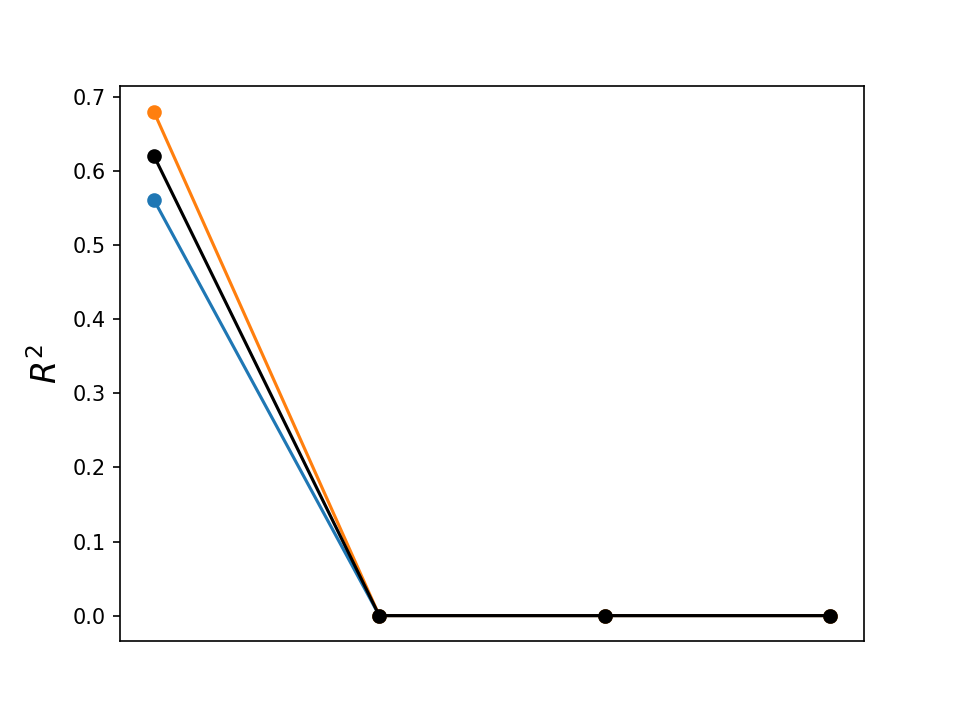

In [28]:
fig, ax = plt.subplots()
plt.plot(scores[:,1::2].T, markersize=12, marker = '.')
plt.plot(np.mean(scores[:,1::2],axis=0).T, markersize=12, marker = '.', color='k')
ax.set_xticks([])
ax.set_ylabel('$R^2$', fontsize=16)
#ax.set_ylim([.5,.86])
plt.show()

<IPython.core.display.Javascript object>


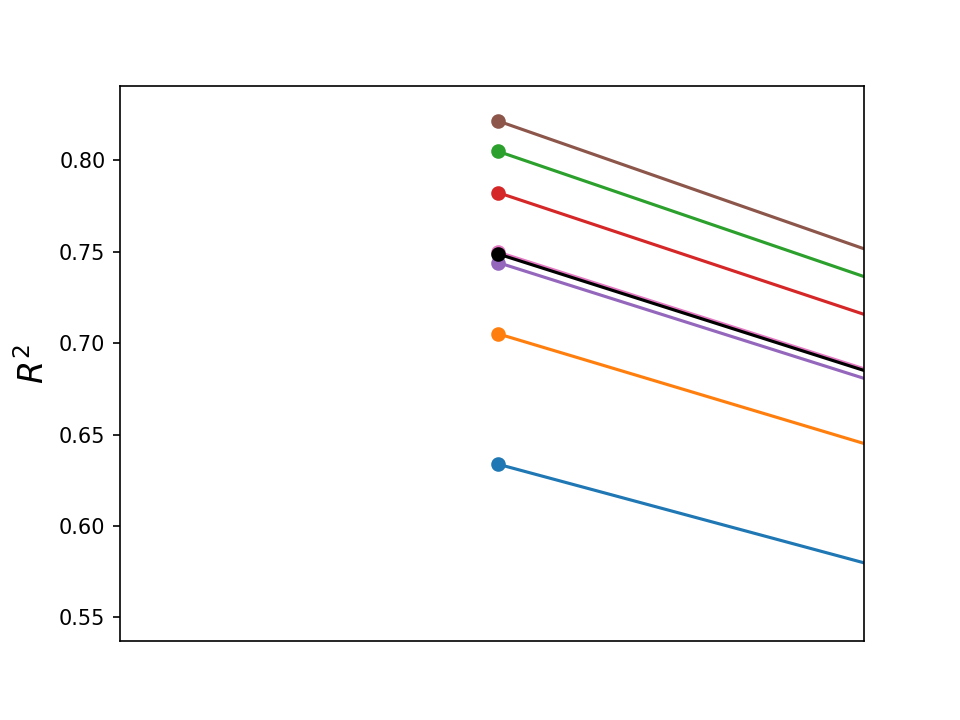

In [18]:
fig, ax = plt.subplots()
plt.plot(scores[:,1::2].T, markersize=12, marker = '.')
plt.plot(np.mean(scores[:,1::2],axis=0).T, markersize=12, marker = '.', color='k')
ax.set_xticks([])
ax.set_ylabel('$R^2$', fontsize=16)
#ax.set_ylim([.5,.86])
plt.show()

<IPython.core.display.Javascript object>


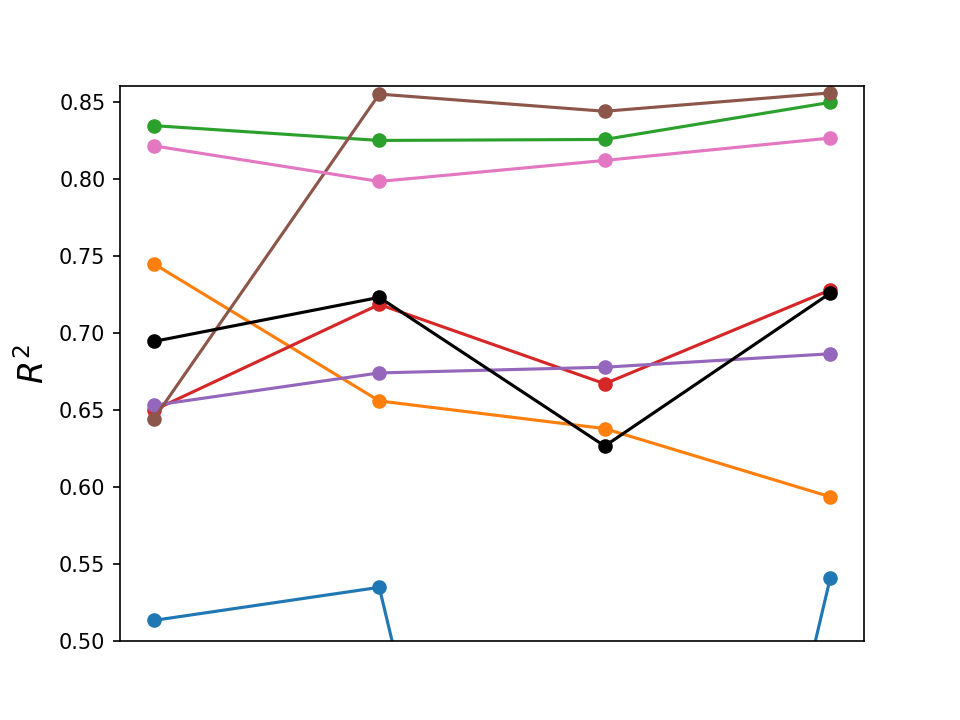

In [14]:
fig, ax = plt.subplots()
plt.plot(scores[:,1::2].T, markersize=12, marker = '.')
plt.plot(np.mean(scores[:,1::2],axis=0).T, markersize=12, marker = '.', color='k')
ax.set_xticks([])
ax.set_ylabel('$R^2$', fontsize=16)
ax.set_ylim([.5,.86])
plt.show()

<IPython.core.display.Javascript object>


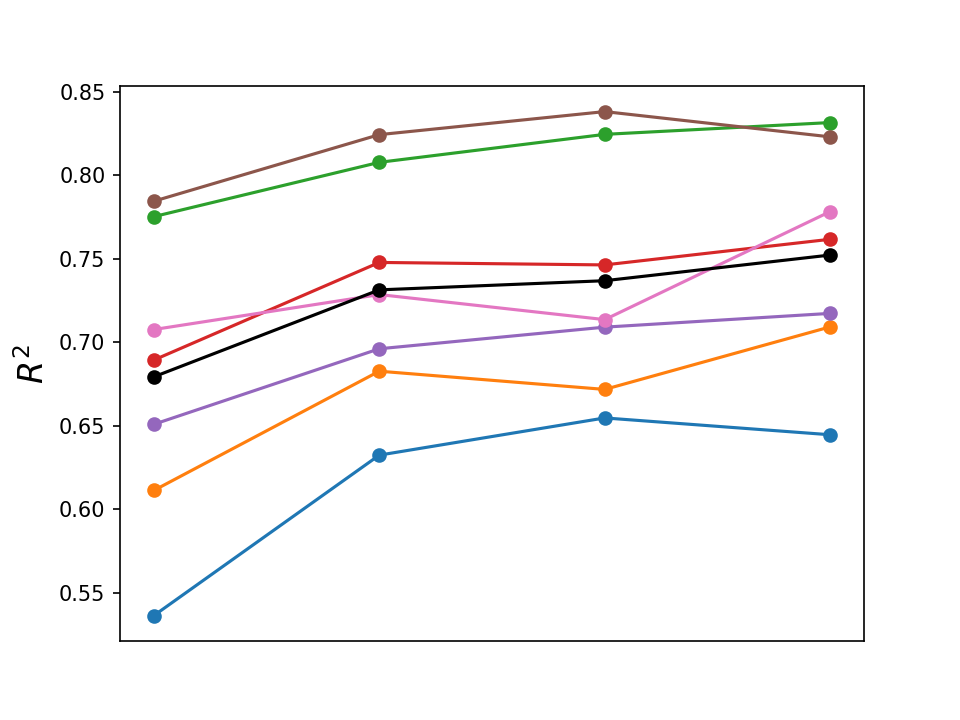

In [9]:
fig, ax = plt.subplots()
plt.plot(scores[:,1::2].T, markersize=12, marker = '.')
plt.plot(np.mean(scores[:,1::2],axis=0).T, markersize=12, marker = '.', color='k')
ax.set_xticks([])
ax.set_ylabel('$R^2$', fontsize=16)
plt.show()

<IPython.core.display.Javascript object>


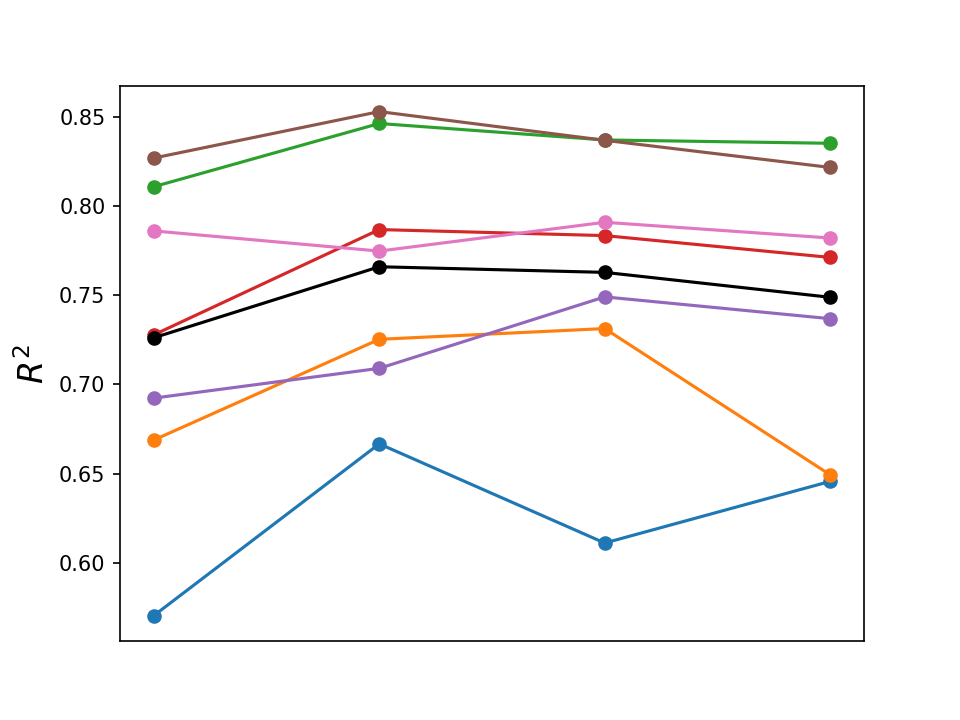

In [7]:
fig, ax = plt.subplots()
plt.plot(scores[:,1::2].T, markersize=12, marker = '.')
plt.plot(np.mean(scores[:,1::2],axis=0).T, markersize=12, marker = '.', color='k')
ax.set_xticks([])
ax.set_ylabel('$R^2$', fontsize=16)
plt.show()

<IPython.core.display.Javascript object>


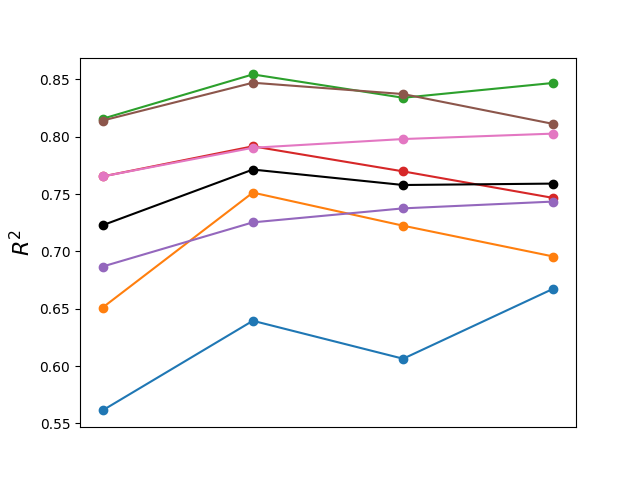

In [413]:
fig, ax = plt.subplots()
plt.plot(scores[:,1::2].T, markersize=12, marker = '.')
plt.plot(np.mean(scores[:,1::2],axis=0).T, markersize=12, marker = '.', color='k')
ax.set_xticks([])
ax.set_ylabel('$R^2$', fontsize=16)
plt.show()

<IPython.core.display.Javascript object>


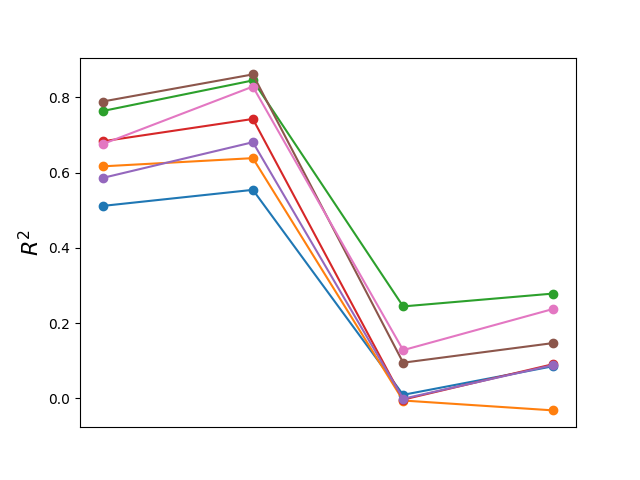

In [308]:
fig, ax = plt.subplots()
plt.plot(scores[:,1::2].T, markersize=12, marker = '.')
ax.set_xticks([])
ax.set_ylabel('$R^2$', fontsize=16)

plt.show()

<IPython.core.display.Javascript object>


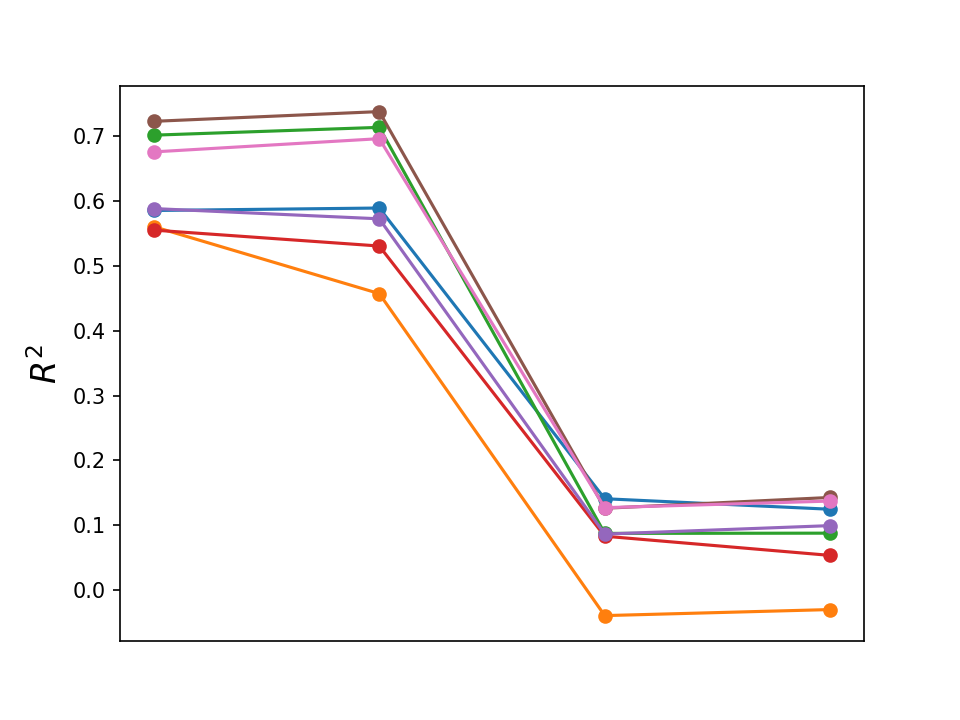

In [14]:
fig, ax = plt.subplots()
plt.plot(scores[:,1::2].T, markersize=12, marker = '.')
ax.set_xticks([])
ax.set_ylabel('$R^2$', fontsize=16)

plt.show()

<IPython.core.display.Javascript object>


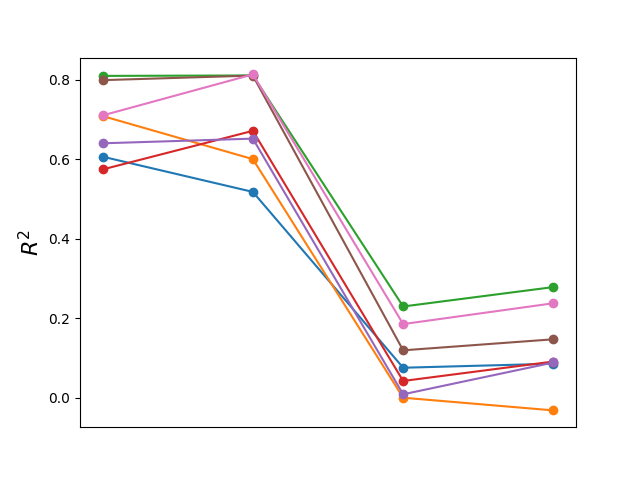

In [21]:
fig, ax = plt.subplots()
plt.plot(scores[:,1::2].T, markersize=12, marker = '.')
ax.set_xticks([])
ax.set_ylabel('$R^2$', fontsize=16)

#ax.set_ylim(-.09, 1)

plt.show()

<IPython.core.display.Javascript object>


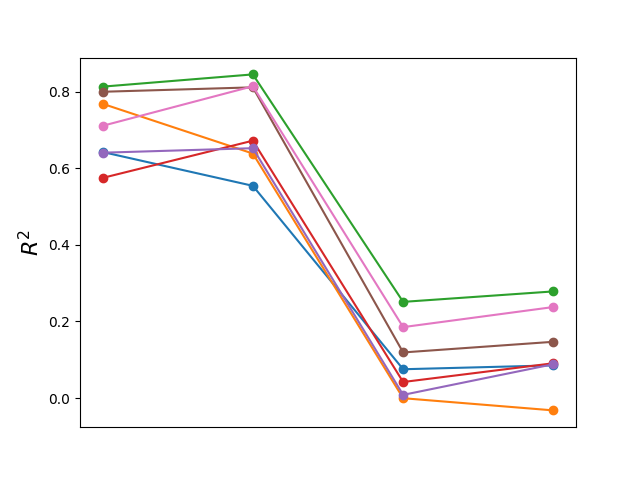

In [23]:
fig, ax = plt.subplots()
plt.plot(scores[:,1::2].T, markersize=12, marker = '.')
ax.set_xticks([])
ax.set_ylabel('$R^2$', fontsize=16)

#ax.set_ylim(-.09, 1)

plt.show()

<IPython.core.display.Javascript object>


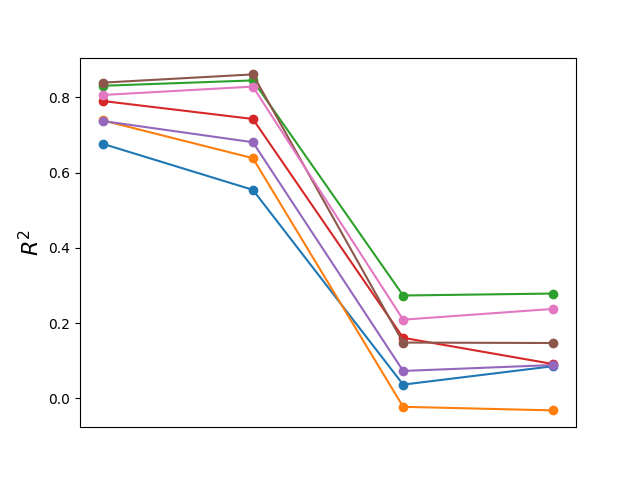

In [26]:
fig, ax = plt.subplots()
plt.plot(scores[:,1::2].transpose(), markersize=12, marker = '.')
ax.set_xticks([])
ax.set_ylabel('$R^2$', fontsize=16)

#ax.set_ylim(-.09, .8)

plt.show()

<IPython.core.display.Javascript object>


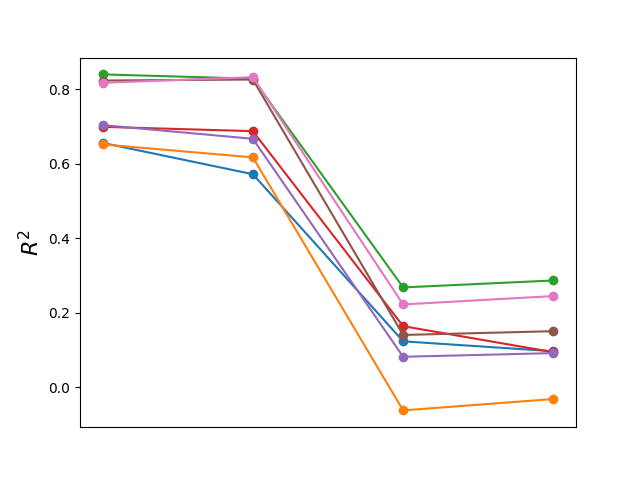

In [478]:
fig, ax = plt.subplots()
plt.plot(scores_pupil[:,1::2].transpose(), markersize=12, marker = '.')
ax.set_xticks([])
ax.set_ylabel('$R^2$', fontsize=16)

plt.show()

<IPython.core.display.Javascript object>


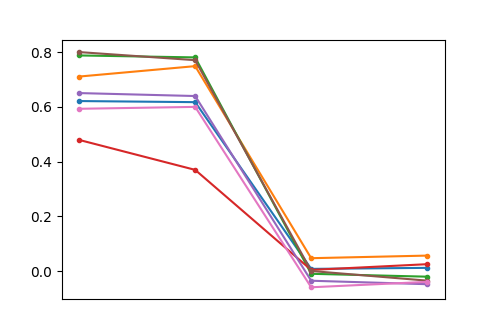

In [169]:
fig, ax = plt.subplots()
plt.plot(scores_face[:,1::2].transpose(), marker = '.')
ax.set_xticks([])

plt.show()

In [13]:
scores_face = scores

In [18]:
scores_pupil = scores

In [357]:
scores_pupil.mean(axis=0)

array([0.79498353, 0.74155947, 0.7538765 , 0.71855641, 0.09047099,
       0.1337843 , 0.07320552, 0.13312952])

In [1]:
scores_pupil.std(axis=0)

NameError: name 'scores_pupil' is not defined

In [ ]:
data_dir = '/home/ryraut/code/arousal/outputs'

Fs = 20
dt = 1/Fs
stackmax = 100
spacing = 4
n = 10
r = 10
nsamples = 6000
alpha = .001


lag = 1 # in seconds
lag = lag*Fs*spacing

subjects = np.arange(1,10)
subjects = np.delete(subjects, [1, 2])

subjects = subjects[:1]
scores = np.zeros([len(subjects),2])

for s in range(len(subjects)):
    
    tic()
    
    subj = subjects[s]

    # Load data
    data_dict = mat73.loadmat(data_dir + '/' + str(subj) + '_pupil.mat')
    pupil = data_dict['pupil'].reshape(-1,1)
    data_dict = mat73.loadmat(data_dir + '/' + str(subj) + '_face.mat')
    face = data_dict['face'].reshape(-1,1)
    data_dict = mat73.loadmat(data_dir + '/' + str(subj) + '_jrgeco.mat')
    brain = data_dict['data'][:,mask_long]
    pupil = pupil[800:,:]
    brain = brain[800:,:]
    face = face[800:,:]
    
    ## Preprocess
    sos = signal.butter(2, [.01,.2],btype = 'bandpass', output = 'sos', fs = Fs)
    pupil = signal.sosfiltfilt(sos, pupil, axis = 0)
    brain = signal.sosfiltfilt(sos, brain, axis = 0)
    face = signal.sosfiltfilt(sos, face, axis = 0)
    face_short = face[spacing*(stackmax-1):,:]
    face_short,_ = scaler(face_short)

    
    ## DELAY EMBED
    Hp = hankel_matrix(pupil.transpose(),stackmax,spacing)
    Hpu, Hps, Hpvh = np.linalg.svd(Hp, full_matrices=False)

    yproj = brain[spacing*(stackmax-1):,:]

    xtrain = Hpvh[:r,:nsamples].transpose()
    ytrain = yproj[:nsamples,:]
    
    xtrain, scale_x = scaler(xtrain)
    ytrain, scale_y = scaler(ytrain)
    
    xtrain = xtrain[lag:,:]
    ytrain = ytrain[:-lag,:]
    ######xtrain = np.concatenate([xtrain,face_short[:nsamples-lag,:]],axis=1)

    #scores[s,0], lib, L = SINDy_mapping(xtrain, ytrain, 3, alpha)
    #scores[s,0], model = MLP_predict(xtrain, ytrain)
    scores[s,0], model, encoder, decoder = VAE(xtrain, ytrain, latent_dim=6, beta=1)

        
    # HELD OUT DATA
    nsamples2 = nsamples + 1000
    xtest = Hpvh[:r,nsamples2:].transpose()
    xtest = np.concatenate([xtest,face_short[nsamples2:,:]],axis=1)
    ytest = yproj[nsamples2:,:]
    
    # SINDy validation test
    xtest,_ = scaler(xtest, scale_x)
    ytest,_ = scaler(ytest, scale_y)
    
    xtest = xtest[lag:,:]
    ytest = ytest[:-lag,:]

    #Xi = lib.transform(xtest)
    #ytest_hat = L.predict(Xi)
    ytest_hat = model.predict(xtest)
    scores[s,1] = r2_score(ytest, ytest_hat, multioutput = 'variance_weighted')
    
    toc()

In [262]:
def kEDMD(X_in, sigma=20, n_eigs=6):
    
    from deeptime.kernels import GaussianKernel
    from deeptime.decomposition import KernelEDMD
    
    X = X_in[:-1,:]
    Y = X_in[1:,:]

    kernel = GaussianKernel(sigma)
    kedmd_estimator = KernelEDMD(kernel, n_eigs=n_eigs+1, epsilon=1e-3)
    kedmd_model = kedmd_estimator.fit((X, Y)).fetch_model()

    phi = kedmd_model.transform(X)

    # normalize
    for i in range(n_eigs+1):
        phi[:, i] = phi[:, i] / np.max(np.abs(phi[:, i]))
        
    # map complex conjugate pairs to real & imag
    phi_new = np.zeros([phi.shape[0],n_eigs])
    
    i = 0

    while i < len(range(n_eigs-1)):
        if np.sum(np.iscomplex(phi[:,i])):
            phi_new[:,i] = np.real(phi[:,i])
            phi_new[:,i+1] = np.imag(phi[:,i+1])
            
            i+=1
            
        else:
            phi_new[:,i] = phi[:,i]
            
        i+=1
    
    phi = phi_new[:,:-1]
        
    return kedmd_model, phi

In [283]:
from pydmd import DMD, FbDMD, SubspaceDMD
#dmd = DMD(svd_rank=n, sorted_eigs='real')
dmd = SubspaceDMD(svd_rank=-1, sorted_eigs='abs')
tic()
#utest,_,_ = encoder.predict(xtest)
#dmd.fit(brain[spacing*(stackmax-1):-3000+nsamples + spacing*(stackmax-1),:].T)
dmd.fit(xtest.T)
toc()

Elapsed time is 1.3524906635284424 seconds.


In [ ]:
#fig, ax = plt.subplots()
#for mode in dmd.modes.T:
#    plt.plot(mode.real)
#    plt.title('Modes')
#plt.show()

#fig, ax = plt.subplots()
#for dynamic in dmd.dynamics:
#    plt.plot(dynamic.imag)
#    plt.title('Dynamics')
#plt.show()

<IPython.core.display.Javascript object>


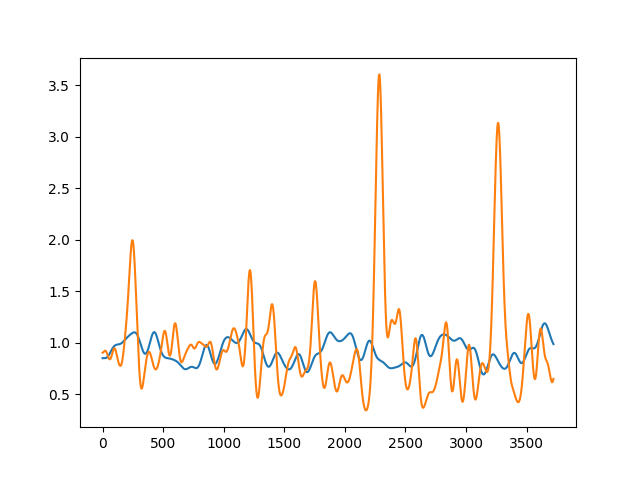

In [73]:
fig, ax = plt.subplots()
temp = scale_y.inverse_transform(model.predict((dmd.modes@dmd.dynamics).T))
plt.plot(temp@spatial_modes[0,:].T)
#temp = (dmd.modes@dmd.dynamics).T
plt.plot(ytest@spatial_modes[0,:].T)
plt.show()

In [245]:
dmd_modes = np.zeros([brain.shape[1],n])
i = 0

while i < len(range(n-1)):
    
    if np.sum(np.iscomplex(dmd.modes[:,i])):
        dmd_modes[:,i] = np.real(dmd.modes[:,i])
        dmd_modes[:,i+1] = np.imag(dmd.modes[:,i+1])
        
        i+=1
        
    else:
        dmd_modes[:,i] = dmd.modes[:,i]
        
    i+=1

dmd_modes = dmd_modes[:,:-1]

spatial_modes = dmd_modes.transpose()

In [279]:
tic()
kedmd_model, phi = kEDMD(brain[spacing*(stackmax-1):-4000+nsamples + spacing*(stackmax-1),:],20,n)
toc()
spatial_modes = phi.transpose()

/tmp/ipykernel_13630/2333361071.py:32: ComplexWarning: Casting complex values to real discards the imaginary part
  phi_new[:,i] = phi[:,i]


In [280]:
temp = kedmd_model.transform(brain[spacing*(stackmax-1):nsamples + spacing*(stackmax-1),:])
#temp = kedmd_model.transform(brain[spacing*(stackmax-1)+nsamples2:,:])

phi = temp

# normalize
for i in range(n+1):
    phi[:, i] = phi[:, i] / np.max(np.abs(phi[:, i]))

# map complex conjugate pairs to real & imag
phi_new = np.zeros([phi.shape[0],n_eigs])

i = 0

while i < len(range(n-1)):
    if np.sum(np.iscomplex(phi[:,i])):
        phi_new[:,i] = np.real(phi[:,i])
        phi_new[:,i+1] = np.imag(phi[:,i+1])

        i+=1

    else:
        phi_new[:,i] = phi[:,i]

    i+=1

phi = phi_new[:,:-1]

temp = phi

/tmp/ipykernel_13630/4135280473.py:23: ComplexWarning: Casting complex values to real discards the imaginary part
  phi_new[:,i] = phi[:,i]


<IPython.core.display.Javascript object>


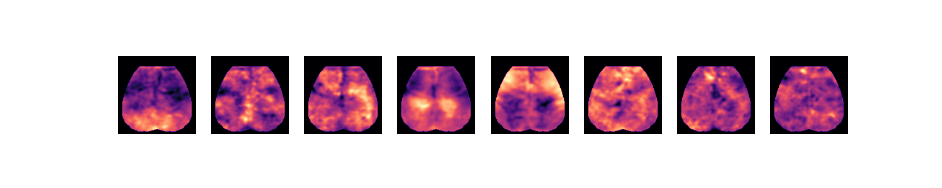

In [236]:
# visualize components

temp = np.zeros((16384,1), dtype=np.single)

fig, axes = plt.subplots(1,8,sharex='col',figsize=(9.42,1.88))

axes = axes.flatten()
for i, ax in enumerate(axes):
    temp = np.zeros((16384,1), dtype=np.single)
    temp[mask_long] = spatial_modes[i,:].reshape(-1,1)
    temp[~mask_long] = np.min(spatial_modes[i,:])
    temp = temp.reshape(128,128,order='F')
    im = ax.imshow(temp, cmap = 'magma')
    ax.axis('off')


In [30]:
s = 1

data_dir = '/home/ryraut/code/arousal/outputs'

data_dict = mat73.loadmat(data_dir + '/' + str(s) + '_pupil.mat')
pupil = data_dict['pupil'].reshape(-1,1)
data_dict = mat73.loadmat(data_dir + '/' + str(s) + '_jrgeco.mat')
brain = data_dict['data'][:,mask_long]
data_dict = mat73.loadmat(data_dir + '/' + str(s) + '_face.mat')
face = data_dict['face'].reshape(-1,1)

pupil = pupil[800:,:]
brain = brain[800:,:]
face = face[800:,:]

#spatial_modes = SVD_projection(brain[:500,:])

Fs = 20
dt = 1/Fs
sos = signal.butter(2, [.01,.2],btype = 'bandpass', output = 'sos', fs = Fs)
pupil = signal.sosfiltfilt(sos, pupil, axis = 0)
face = signal.sosfiltfilt(sos, face, axis = 0)
brain = signal.sosfiltfilt(sos, brain, axis = 0)

#pupil,_ = scaler(pupil)
#brain,_ = scaler(brain)

<IPython.core.display.Javascript object>


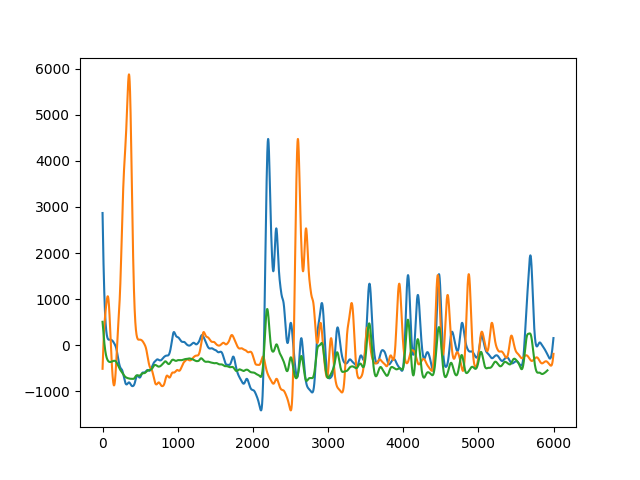

In [365]:
fig,ax = plt.subplots()
plt.plot(Hp[-1,:nsamples])
plt.plot(Hp[0,:nsamples])
plt.plot(10*ytrain@vh.T[:,0])

In [56]:
## DELAY EMBED
Fs = 20
dt = 1/Fs
stackmax = 100
spacing = 4
r = 10
nsamples = 6000

lag = 1 # in seconds
lag = lag*Fs*spacing

Hp = hankel_matrix(pupil.T,stackmax,spacing)
#Hpu, Hps, Hpvh = np.linalg.svd(Hp, full_matrices=False)

yproj = brain.copy()

## GSR
#gs = np.mean(brain, axis=1).reshape(-1,1)
#betas = np.linalg.pinv(gs).dot(brain)
#yproj = brain - gs.dot(betas)
#yproj = brain - gs
##

yproj = yproj[spacing*(stackmax-1):,:]

#yproj = yproj@vh_keep.T[:,0:3]

#xtrain = (np.diag(Hps[:r])@Hpvh[:r,:nsamples]).T
#xtrain = Hp[:,:nsamples].T

polys = true_polys(stackmax, 1/Fs, r, center=False)
xtrain = (polys.T@Hp[:,:nsamples]).T
ytrain = yproj[:nsamples,:]

xtrain, scale_x = scaler(xtrain)
ytrain, scale_y = scaler(ytrain)

xtrain = xtrain[lag:,:]
ytrain = ytrain[:-lag,:]
    
r_squared, model, encoder, decoder = VAE(xtrain, ytrain, latent_dim=6, beta=1, num_epochs=200)
r_squared

Epoch 1/200
6/6 [==============================] - 1s 86ms/step - loss: 0.2518 - reconstruction_loss: 0.1511 - kl_loss: 0.0406
Epoch 2/200
6/6 [==============================] - 1s 93ms/step - loss: 0.0920 - reconstruction_loss: 0.0722 - kl_loss: 0.0156
Epoch 3/200
6/6 [==============================] - 1s 95ms/step - loss: 0.0669 - reconstruction_loss: 0.0555 - kl_loss: 0.0105
Epoch 4/200
6/6 [==============================] - 1s 87ms/step - loss: 0.0547 - reconstruction_loss: 0.0484 - kl_loss: 0.0054
Epoch 5/200
6/6 [==============================] - 1s 85ms/step - loss: 0.0501 - reconstruction_loss: 0.0442 - kl_loss: 0.0047
Epoch 6/200
6/6 [==============================] - 1s 86ms/step - loss: 0.0459 - reconstruction_loss: 0.0413 - kl_loss: 0.0034
Epoch 7/200
6/6 [==============================] - 1s 83ms/step - loss: 0.0411 - reconstruction_loss: 0.0377 - kl_loss: 0.0028
Epoch 8/200
6/6 [==============================] - 1s 89ms/step - loss: 0.0413 - reconstruction_loss: 0.0440 - 

6/6 [==============================] - 1s 83ms/step - loss: 0.0288 - reconstruction_loss: 0.0264 - kl_loss: 0.0018
Epoch 66/200
6/6 [==============================] - 0s 81ms/step - loss: 0.0289 - reconstruction_loss: 0.0281 - kl_loss: 0.0019
Epoch 67/200
6/6 [==============================] - 1s 85ms/step - loss: 0.0288 - reconstruction_loss: 0.0270 - kl_loss: 0.0020
Epoch 68/200
6/6 [==============================] - 1s 89ms/step - loss: 0.0279 - reconstruction_loss: 0.0262 - kl_loss: 0.0022
Epoch 69/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0283 - reconstruction_loss: 0.0265 - kl_loss: 0.0022
Epoch 70/200
6/6 [==============================] - 0s 79ms/step - loss: 0.0285 - reconstruction_loss: 0.0265 - kl_loss: 0.0021
Epoch 71/200
6/6 [==============================] - 1s 86ms/step - loss: 0.0281 - reconstruction_loss: 0.0257 - kl_loss: 0.0022
Epoch 72/200
6/6 [==============================] - 0s 79ms/step - loss: 0.0279 - reconstruction_loss: 0.0256 - kl_lo

6/6 [==============================] - 0s 79ms/step - loss: 0.0256 - reconstruction_loss: 0.0225 - kl_loss: 0.0024
Epoch 192/200
6/6 [==============================] - 0s 80ms/step - loss: 0.0239 - reconstruction_loss: 0.0217 - kl_loss: 0.0023
Epoch 193/200
6/6 [==============================] - 1s 91ms/step - loss: 0.0241 - reconstruction_loss: 0.0216 - kl_loss: 0.0023
Epoch 194/200
6/6 [==============================] - 1s 86ms/step - loss: 0.0247 - reconstruction_loss: 0.0227 - kl_loss: 0.0022
Epoch 195/200
6/6 [==============================] - 0s 82ms/step - loss: 0.0246 - reconstruction_loss: 0.0225 - kl_loss: 0.0021
Epoch 196/200
6/6 [==============================] - 0s 84ms/step - loss: 0.0242 - reconstruction_loss: 0.0220 - kl_loss: 0.0021
Epoch 197/200
6/6 [==============================] - 0s 82ms/step - loss: 0.0259 - reconstruction_loss: 0.0241 - kl_loss: 0.0023
Epoch 198/200
6/6 [==============================] - 1s 84ms/step - loss: 0.0257 - reconstruction_loss: 0.0229 

0.8053494268708277

In [57]:
# HELD OUT DATA
nsamples2 = nsamples + 1000
#xtest = (np.diag(Hps[:r])@Hpvh[:r,nsamples2:]).T
#xtest = Hp[:,nsamples2:].transpose()
xtest = (polys.T@Hp[:,nsamples2:]).T

ytest = yproj[nsamples2:,:]

In [58]:
xtest,_ = scaler(xtest, scale_x)
ytest,_ = scaler(ytest, scale_y)

xtest = xtest[lag:,:]
ytest = ytest[:-lag,:]

ytest_hat = model.predict(xtest)
r2_score(ytest, ytest_hat, multioutput='variance_weighted')

0.5574986765913271

In [59]:
ytest = scale_y.inverse_transform(ytest)
ytest_hat = scale_y.inverse_transform(ytest_hat)
r2_score(ytest, ytest_hat, multioutput='variance_weighted')

0.6477793115150898

In [47]:
## projected back
ytest = brain[spacing*(stackmax-1)+nsamples2:-lag,:]
ytest_hat = ytest_hat@vh_keep[0:3,:]
r2_score(ytest, ytest_hat, multioutput='variance_weighted')

NameError: name 'vh_keep' is not defined

In [164]:
gs = np.mean(ytest, axis=1).reshape(-1,1)
betas = np.linalg.pinv(gs).dot(ytest)
ytest = ytest - gs.dot(betas)

gs = np.mean(ytest_hat, axis=1).reshape(-1,1)
betas = np.linalg.pinv(gs).dot(ytest_hat)
ytest_hat = ytest_hat - gs.dot(betas)

In [31]:
num_bins = 100

lim = 1
xx,yy = np.meshgrid(np.linspace(-lim,lim,num_bins),np.linspace(-lim,lim,num_bins))

Z = np.zeros((num_bins,num_bins,ytrain.shape[1]))
for i in range(num_bins): # col by col
    Z[:,i,:] = decoder.predict(np.vstack(([xx[:,i]],yy[:,i])).T)
    
#for i in range(num_bins):
#    for j in range(num_bins):
#        decoder.predict(np.vstack(([xx[:,i]],yy[:,i])).T)[:,v]
#        Z[i,j,:] = decoder.predict([xx[i,j],yy[i,j]])

4/4 [==============================] - 0s 2ms/step


In [75]:
def plot_latent_space(decoder, n=5, figsize=10):
    
    # display n*n 2D manifold
    digit_size = 128
    scale = 5
    figure = np.zeros((digit_size * n, digit_size * n))

    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])
            x_decoded = decoder.predict(z_sample)
            
            outmat = np.zeros((16384,1), dtype=np.single)
            outmat[mask_long] = x_decoded.T
            outmat = np.ma.masked_where(outmat==0, outmat)

            digit = outmat.reshape(digit_size, digit_size, order='F')
            figure[
                i * digit_size : (i + 1) * digit_size,
                j * digit_size : (j + 1) * digit_size,
            ] = digit

    #np.ma.masked_where(figure==0, figure)
    figure[figure==0] = -10
    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    cmap = cm.get_cmap('magma').copy()
    cmap.set_bad(color='black')
    plt.imshow(figure, vmin=-1, vmax=1, cmap=cmap)
    plt.show()
    
    return figure



1/1 [==============================] - 0s 18ms/step


<IPython.core.display.Javascript object>


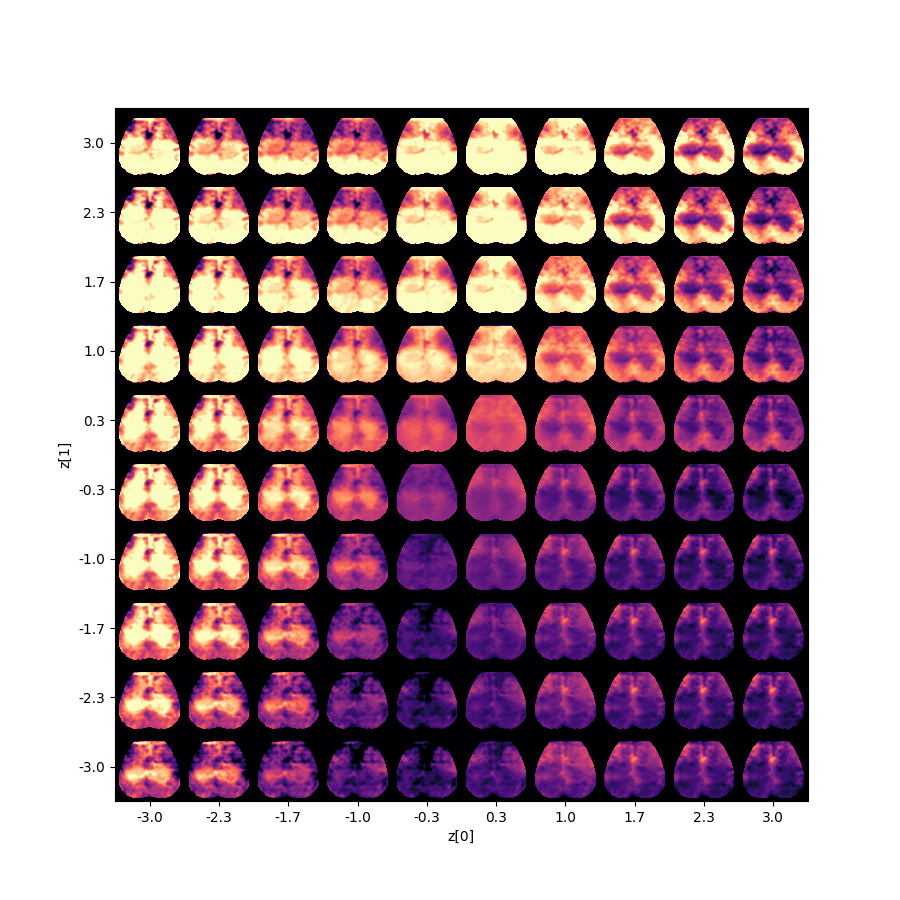

In [77]:
fig = plot_latent_space(decoder, n=10, figsize=9)

<IPython.core.display.Javascript object>


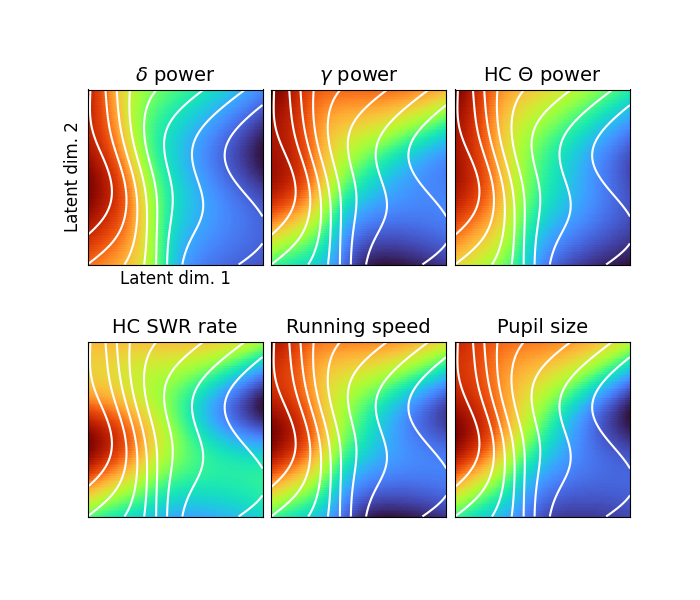

/tmp/ipykernel_510/2363261384.py:16: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  p = ax[v].pcolormesh(xx, yy, z, edgecolors='face', cmap='turbo', vmin=np.min(z), vmax=np.max(z))


In [35]:
plt.style.use('default')

from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(2,3,figsize=(7, 6))
ax = ax.ravel()
fig.subplots_adjust(wspace=0.05)

titles=['$\delta$ power','$\gamma$ power','HC $\Theta$ power','HC SWR rate','Running speed','Pupil size']


for v in range(6):
    ax[v].grid(False)
    ax[v].axis('square')
    z = Z[:,:,v*1000]
    p = ax[v].pcolormesh(xx, yy, z, edgecolors='face', cmap='turbo', vmin=np.min(z), vmax=np.max(z))
    
    #divider = make_axes_locatable(ax[v])
    #cax = divider.append_axes("right", size="10%", pad="5%")
    #plt.colorbar(p, cax=cax)
    
    #levels = np.linspace(np.min(z), np.max(z), 10)
    #ax[v].contour(xx, yy, z, levels, colors='w', linestyles='solid')
    levels = np.linspace(np.min(Z[:,:,0]), np.max(Z[:,:,0]), 10)
    ax[v].contour(xx, yy, Z[:,:,0], levels, colors='w', linestyles='solid')
    #levels = np.linspace(0, 1.5, 8)
    #ax[v].contour(xx, yy, np.sqrt(xx**2 + yy**2), levels, colors = 'w')
    #levels = np.linspace(-math.pi, math.pi, 12)
    #ax[v].contour(xx, yy, np.arctan2(xx,yy), levels, colors = 'w', linestyles='solid')
    
    #dx, dy = np.gradient(z)
    #ax[v].quiver(xx, yy, dx, dy, color='w', scale=5

    ax[v].set_xlim([-lim,lim])
    ax[v].set_ylim([-lim,lim])

    #ax[v].axis("off")
    ax[v].set_xticks([])
    ax[v].set_yticks([])
    
    ax[v].set_title(titles[v], size=14)#,**afont)#, fontweight='bold')

ax[0].set_xlabel('Latent dim. 1', size=12, **{'fontname':'Arial'})
ax[0].set_ylabel('Latent dim. 2', size=12, **{'fontname':'Arial'})

plt.show()

<IPython.core.display.Javascript object>


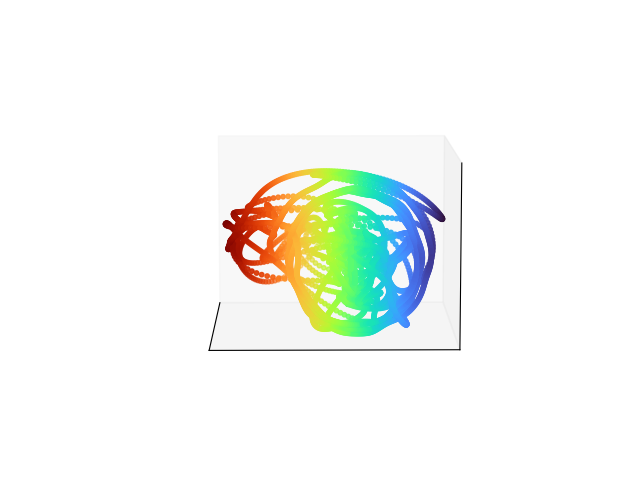

In [281]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
lim = phi.shape[0]
colors = phi[:,1]
ax.scatter(phi[:lim,0],phi[:lim,1],phi[:lim,2],s=40,marker ='.',c=colors[:lim],cmap='turbo')
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

ax.view_init(31,39) #0,1,3 view

plt.show()

In [250]:
ytest_full = brain[spacing*(stackmax-1):,:]
ytest_full = ytest_full[nsamples2:,:]
#ytest_full,_ = scaler(ytest_full)
ytest_full = ytest_full[:-lag,:]
ytest_full_hat = ytest_hat@spatial_modes[:n,:]
#ytest_full_hat = scale_y.inverse_transform(ytest_hat)@spatial_modes[:n,:]
#ytest_full_hat,_ = scaler(ytest_full_hat)
r2_score(ytest_full, ytest_full_hat, multioutput='variance_weighted')

0.27868175250048377

<IPython.core.display.Javascript object>


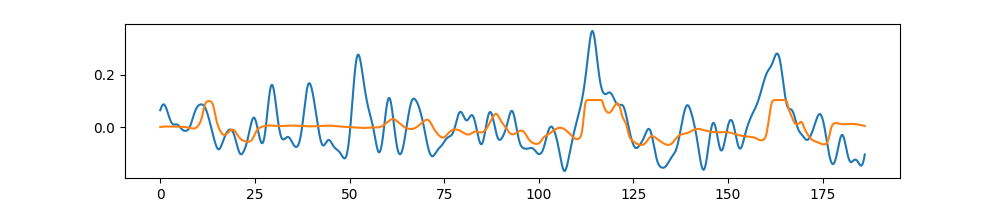

In [251]:
fig, ax = plt.subplots(figsize=(10,2))
time = np.linspace(0, dt*(ytest.shape[0]-1), ytest.shape[0])
plt.plot(time, ytest_full[:,0])
plt.plot(time, ytest_full_hat[:,0])
plt.show()

## CLUSTERING

In [ ]:
start = 3000
stop = start+3000

tic()
u,s,vh = np.linalg.svd(brain[start:stop,:], full_matrices=False)
toc()

In [16]:
#vh_keep = vh.copy()
vh = vh_keep.copy()

<IPython.core.display.Javascript object>


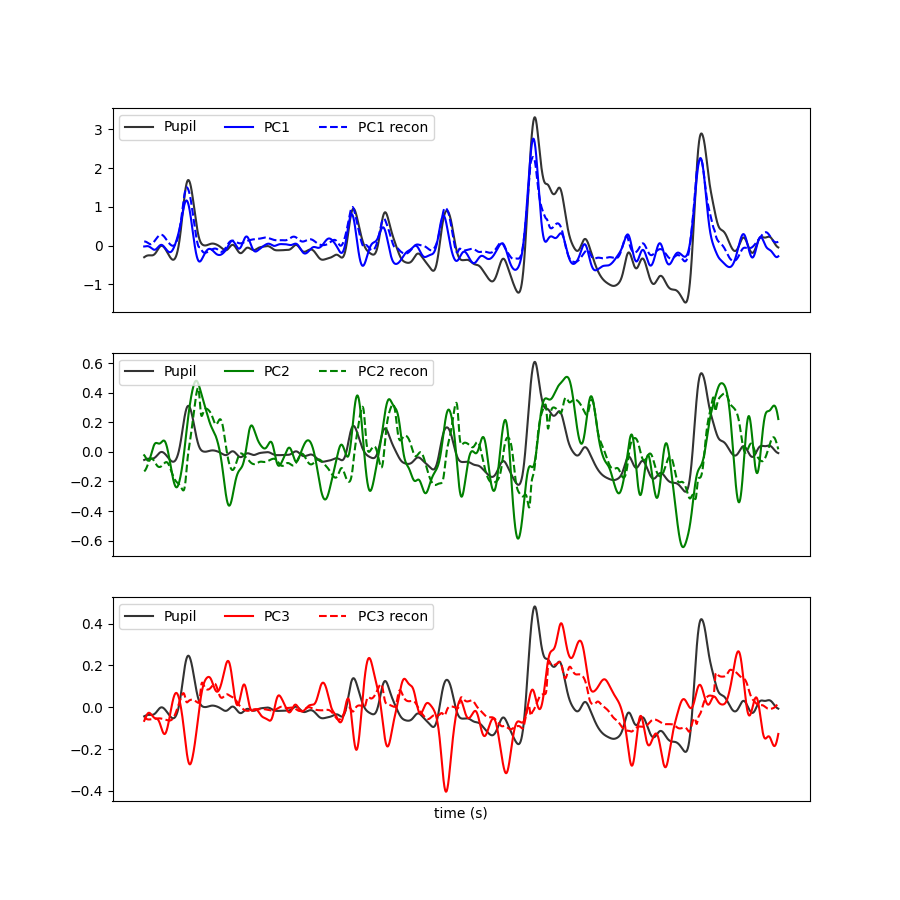

In [377]:
## PC DYNAMICS

fig, axes = plt.subplots(3,1,sharex='col',figsize=(9,9))

dt = .05
t = np.arange(0,ytest.shape[0]*dt,dt)
plt.xlabel("time (s)")

pupil_plot = pupil[-ytest.shape[0]-lag:-lag]
pupil_plot = (1/np.max(pupil_plot))*pupil_plot

face_plot = face[-ytest.shape[0]-lag:-lag]
face_plot = (1/np.max(face_plot))*face_plot

#ytest_hat = ytest_hat.numpy()

y_plot = ytest@(vh.T[:,:5])
yhat_plot = ytest_hat@(vh.T[:,:5])

ax = 0
#axes[ax].plot(t,1.2*np.max(ytest[:,ax])*face_plot,'y',alpha=.6)
axes[ax].plot(t,1.2*np.max(y_plot[:,ax])*pupil_plot,'k',alpha=.8, label="Pupil")
axes[ax].plot(t,y_plot[:,ax],'b', label="PC1")
axes[ax].plot(t,yhat_plot[:,ax],'b',linestyle='dashed',alpha=1, label="PC1 recon")
axes[ax].legend(loc="upper left",ncol=3)
axes[ax].set_xticks([])
    
ax = 1
#axes[ax].plot(t,1.2*np.max(ytest[:,ax])*face_plot,'y',alpha=.6)
axes[ax].plot(t,1.2*np.max(y_plot[:,ax])*pupil_plot,'k',alpha=.8, label="Pupil")
axes[ax].plot(t,y_plot[:,ax],'g',label="PC2")
axes[ax].plot(t,yhat_plot[:,ax],'g',linestyle='dashed', label="PC2 recon")
axes[ax].legend(loc="upper left",ncol=3)
axes[ax].set_xticks([])

ax = 2
#axes[ax].plot(t,1.2*np.max(ytest[:,ax])*face_plot,'y',alpha=.6)
axes[ax].plot(t,1.2*np.max(y_plot[:,ax])*pupil_plot,'k',alpha=.8, label="Pupil")
axes[ax].plot(t,y_plot[:,ax],'r',label="PC3")
axes[ax].plot(t,yhat_plot[:,ax],'r',linestyle='dashed', label="PC3 recon")
axes[ax].legend(loc="upper left",ncol=3)
axes[ax].set_xticks([])

#ax = 3
##axes[ax].plot(t,1.2*np.max(ytest[:,ax])*face_plot,'y',alpha=.6)
#axes[ax].plot(t,10.2*np.max(ytest[:,ax])*pupil_plot,'k',alpha=.8)
#axes[ax].plot(t,ytest@vh.T[:,ax],'m',label=labels[ax])
#axes[ax].plot(t,ytest_hat@vh.T[:,ax],'m',linestyle='dashed')
#axes[ax].legend(loc="upper right")
#axes[ax].set_xticks([])

#plt.suptitle('Widefield reconstructions from pupil size')
plt.show()

#colors = ["r","g","b"]
#for i,ax in enumerate(axes):
#  axs[i].plot([0,1],[1,0],color=colors[i]

<IPython.core.display.Javascript object>


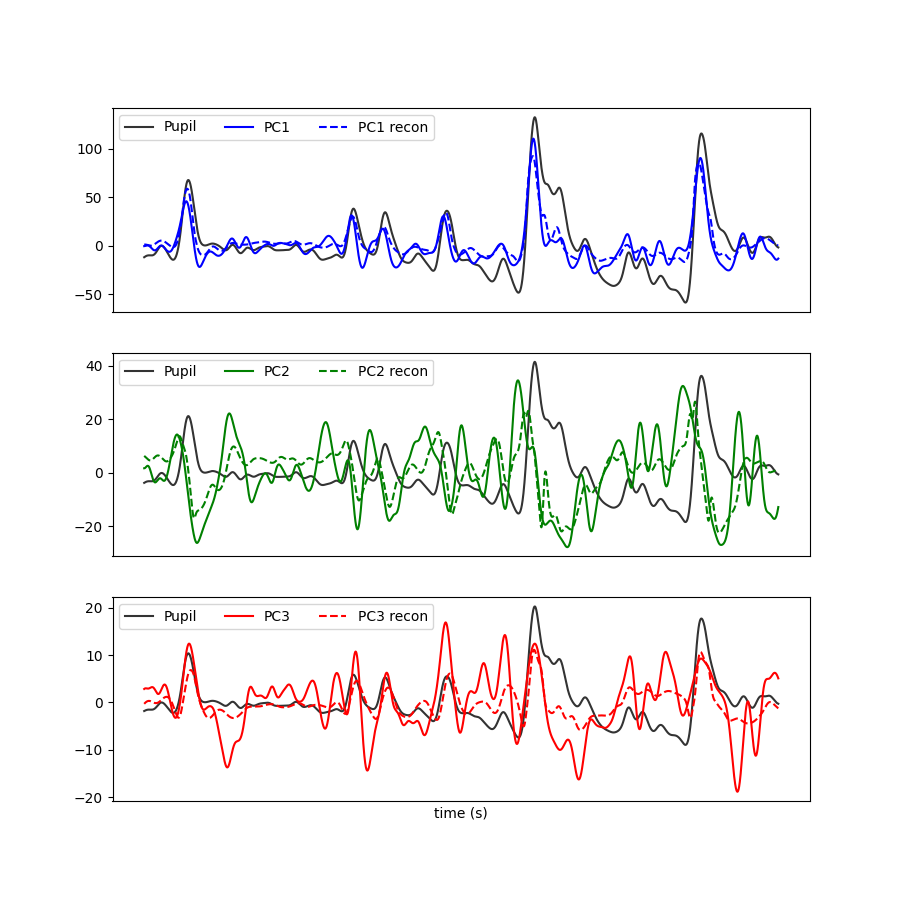

In [120]:
## PC DYNAMICS

fig, axes = plt.subplots(3,1,sharex='col',figsize=(9,9))

dt = .05
t = np.arange(0,ytest.shape[0]*dt,dt)
plt.xlabel("time (s)")

pupil_plot = pupil[-ytest.shape[0]-lag:-lag]
pupil_plot = (1/np.max(pupil_plot))*pupil_plot

face_plot = face[-ytest.shape[0]-lag:-lag]
face_plot = (1/np.max(face_plot))*face_plot

#ytest_hat = ytest_hat.numpy()

#y_plot = ytest@vh.T
#yhat_plot = ytest_hat.numpy()@vh.T

ax = 0
#axes[ax].plot(t,1.2*np.max(ytest[:,ax])*face_plot,'y',alpha=.6)
axes[ax].plot(t,1.2*np.max(y_plot[:,ax])*pupil_plot,'k',alpha=.8, label="Pupil")
axes[ax].plot(t,y_plot[:,ax],'b', label="PC1")
axes[ax].plot(t,yhat_plot[:,ax],'b',linestyle='dashed',alpha=1, label="PC1 recon")
axes[ax].legend(loc="upper left",ncol=3)
axes[ax].set_xticks([])
    
ax = 1
#axes[ax].plot(t,1.2*np.max(ytest[:,ax])*face_plot,'y',alpha=.6)
axes[ax].plot(t,1.2*np.max(y_plot[:,ax])*pupil_plot,'k',alpha=.8, label="Pupil")
axes[ax].plot(t,y_plot[:,ax],'g',label="PC2")
axes[ax].plot(t,yhat_plot[:,ax],'g',linestyle='dashed', label="PC2 recon")
axes[ax].legend(loc="upper left",ncol=3)
axes[ax].set_xticks([])

ax = 2
#axes[ax].plot(t,1.2*np.max(ytest[:,ax])*face_plot,'y',alpha=.6)
axes[ax].plot(t,1.2*np.max(y_plot[:,ax])*pupil_plot,'k',alpha=.8, label="Pupil")
axes[ax].plot(t,y_plot[:,ax],'r',label="PC3")
axes[ax].plot(t,yhat_plot[:,ax],'r',linestyle='dashed', label="PC3 recon")
axes[ax].legend(loc="upper left",ncol=3)
axes[ax].set_xticks([])

#ax = 3
##axes[ax].plot(t,1.2*np.max(ytest[:,ax])*face_plot,'y',alpha=.6)
#axes[ax].plot(t,10.2*np.max(ytest[:,ax])*pupil_plot,'k',alpha=.8)
#axes[ax].plot(t,ytest@vh.T[:,ax],'m',label=labels[ax])
#axes[ax].plot(t,ytest_hat@vh.T[:,ax],'m',linestyle='dashed')
#axes[ax].legend(loc="upper right")
#axes[ax].set_xticks([])

#plt.suptitle('Widefield reconstructions from pupil size')
plt.show()

#colors = ["r","g","b"]
#for i,ax in enumerate(axes):
#  axs[i].plot([0,1],[1,0],color=colors[i]

In [348]:
stats.pearsonr(y_plot[:,2],yhat_plot[:,2])

(0.5817534616731452, 0.0)

<IPython.core.display.Javascript object>


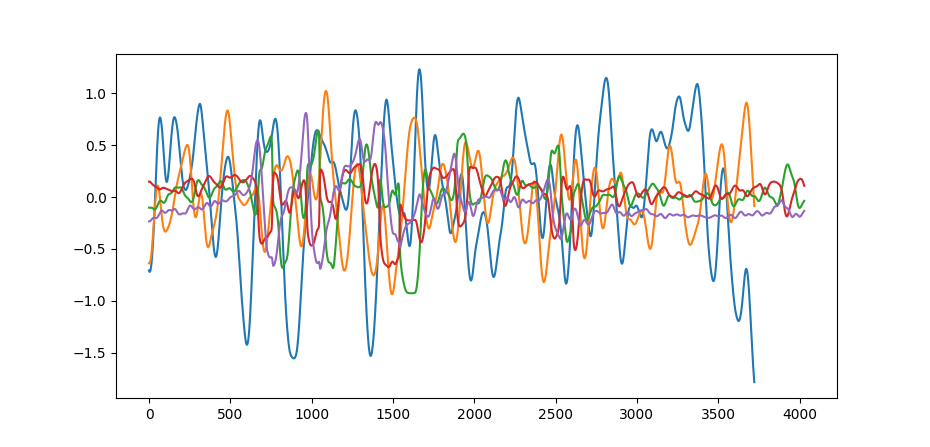

126/126 [==============================] - 0s 1ms/step


In [71]:
fig,ax = plt.subplots()
#u,s,vh = np.linalg.svd(encoder.predict(xtest)[0], full_matrices=False)
plt.plot(u[:,:2]@np.diag(s[:2]))
plt.plot(encoder.predict(xtest)[0][:,:])

<IPython.core.display.Javascript object>


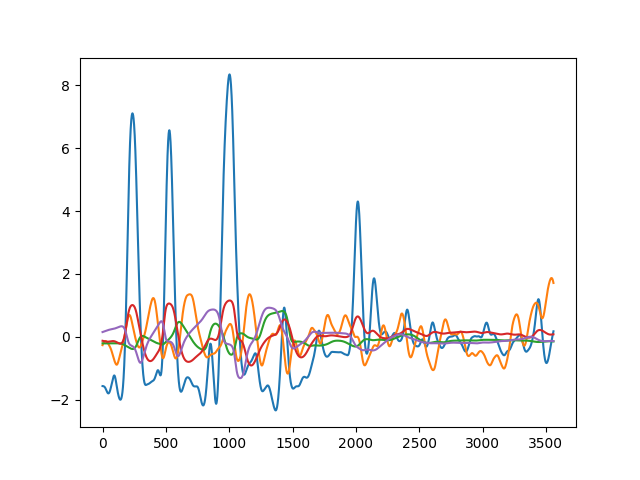

112/112 [==============================] - 0s 1ms/step


In [342]:
fig,ax = plt.subplots()
#u,s,vh = np.linalg.svd(encoder.predict(xtest)[0], full_matrices=False)
plt.plot(u[:,:2]@np.diag(s[:2]))
plt.plot(encoder.predict(xtest)[0][:,:])

<IPython.core.display.Javascript object>


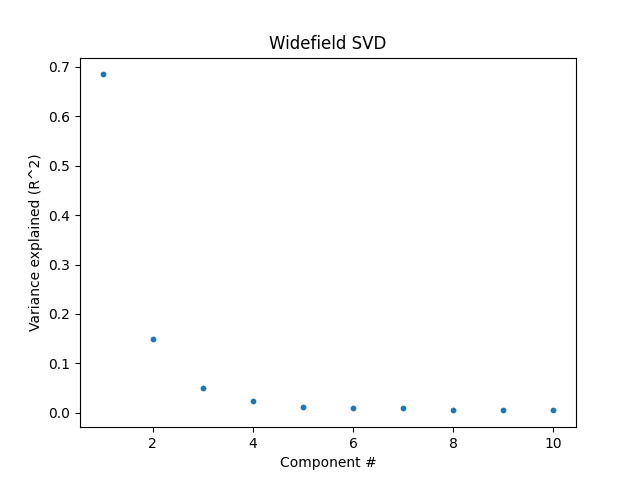

In [355]:
import matplotlib.ticker as mticker
fig, ax = plt.subplots()

u,s,vh = np.linalg.svd(ytest, full_matrices=False)
#u,s,vh = np.linalg.svd(decoder.predict(encoder.predict(xtest)[0])[:,::300], full_matrices=False)
plt.scatter(np.arange(1,11),(s[:10]**2)/np.sum(s**2),10)
ax.set_xlabel("Component #")
ax.set_ylabel("Variance explained (R^2)")
ax.set_title("Widefield SVD")

#plt.yscale('log')
#ax.yaxis.set_major_formatter(mticker.ScalarFormatter())
#ax.xaxis.get_major_formatter().set_scientific(False)
#ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.4f'))
#ax.yaxis.get_major_formatter().set_useOffset(False)

plt.show()

<IPython.core.display.Javascript object>


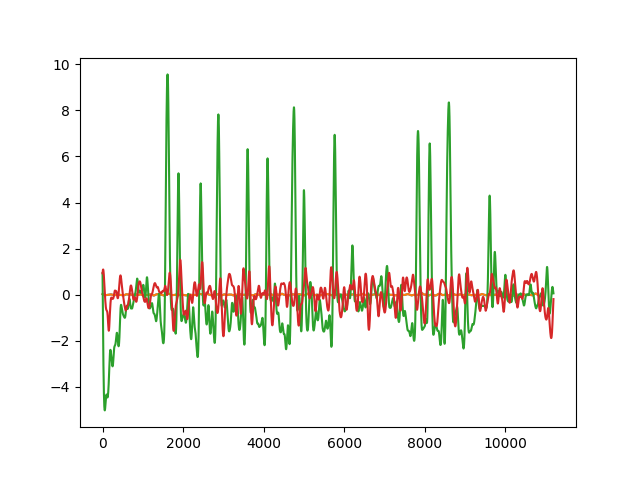

In [11]:
#s = 7
#data_dict = mat73.loadmat(data_dir + '/' + str(s) + '_pupil.mat')
#pupil = data_dict['pupil'].reshape(-1,1)
#plt.plot(stats.zscore(pupil[800:]))

#data_dict = mat73.loadmat(data_dir + '/' + str(s) + '_jrgeco.mat')
#brain = data_dict['data'][:,mask_long]
#brain = brain[800:,:]
plt.plot(yproj[:,:2])
plt.plot(brain@vh_keep.T[:,:2])
#plt.plot(ytest@vh_keep.T[:,2])
#plt.plot(ytest_hat@vh_keep.T[:,2])
#plt.show()
#r2_score(ytest@vh_keep.T[:,1], ytest_hat@vh_keep.T[:,1], multioutput='variance_weighted')

In [380]:
#u,s,vh = np.linalg.svd(ytest, full_matrices=False)
variances = (s[:10]**2)/np.sum(s**2)
r2s = variances.copy()
for i in range(10):
    r2s[i] = r2_score(ytest@vh.T[:,i], ytest_hat@vh.T[:,i], multioutput='variance_weighted')

In [381]:
r2s

array([ 0.7962233 ,  0.49484123,  0.42580464, -0.11238967, -0.14910732,
        0.01509902,  0.08152155, -0.17524529,  0.11024627, -0.04013181])

<IPython.core.display.Javascript object>


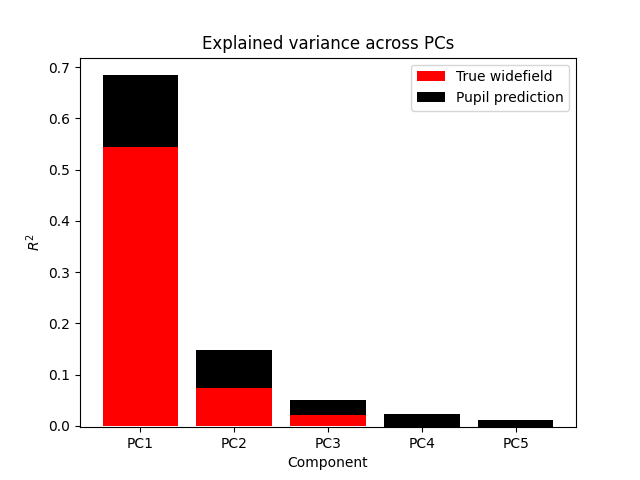

In [382]:
names = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5']
fig,ax = plt.subplots()
plt.bar(names, variances[:5]*r2s[:5], color='r')
plt.bar(names, variances[:5]-variances[:5]*r2s[:5], bottom=(variances*r2s)[:5], color='k')
plt.xlabel("Component")
plt.ylabel("$R^2$")
plt.legend(["True widefield", "Pupil prediction"])
plt.title("Explained variance across PCs")
plt.show()

<IPython.core.display.Javascript object>


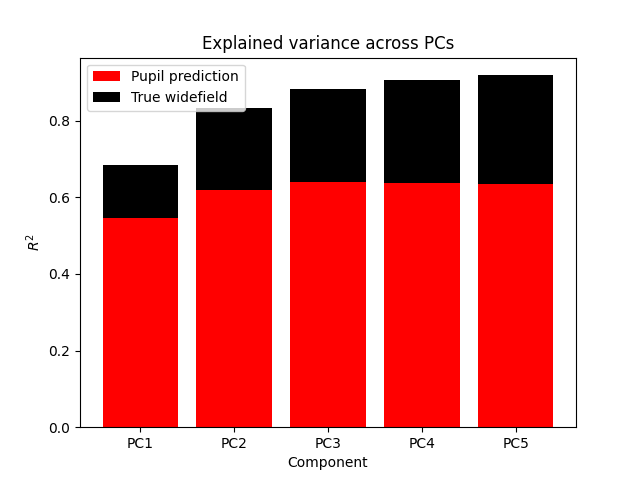

In [388]:
names = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5']
fig,ax = plt.subplots()
plt.bar(names, np.cumsum(variances[:5]*r2s[:5]), color='r')
plt.bar(names, np.cumsum(variances[:5]-variances[:5]*r2s[:5]), bottom=np.cumsum(variances*r2s)[:5], color='k')
plt.xlabel("Component")
plt.ylabel("$R^2$")
plt.legend(["Pupil prediction","True widefield", ])
plt.title("Explained variance across PCs")
plt.show()

In [384]:
np.cumsum(variances[:5]*r2s[:5])

array([0.54499898, 0.61857969, 0.63974541, 0.63708695, 0.63534956])

<IPython.core.display.Javascript object>


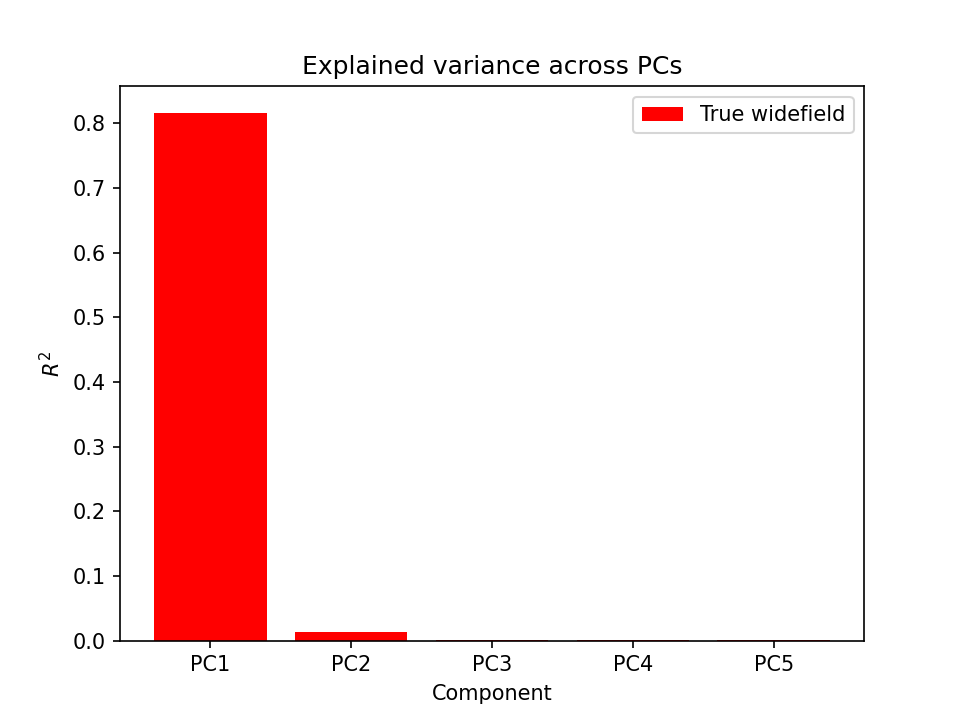

In [268]:
#u,s,vh = np.linalg.svd(ytest_hat, full_matrices=False)
variances = (s[:10]**2)/np.sum(s**2)

r2s = variances.copy()
for i in range(10):
    r2s[i] = r2_score(ytest, (u[:,i:i+1]@u[:,i:i+1].T)@ytest_hat, multioutput='variance_weighted')

names = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5']
fig,ax = plt.subplots()
plt.bar(names, r2s[:5], color='r')
#plt.bar(names, variances[:5]-variances[:5]*r2s[:5], bottom=(variances*r2s)[:5], color='k')
plt.xlabel("Component")
plt.ylabel("$R^2$")
plt.legend(["True widefield", "Pupil prediction"])
plt.title("Explained variance across PCs")
plt.show()

In [107]:
from sklearn.manifold import Isomap
#embedding = Isomap(n_components=3,radius=50,n_neighbors=None)
tic()
embedding = Isomap(n_components=3,radius=10,n_neighbors=None)
colors = embedding.fit_transform(ytest)
#colors = embedding.fit_transform(yproj)[nsamples2:-lag,:]
toc()

Elapsed time is 63.63330030441284 seconds.


<IPython.core.display.Javascript object>


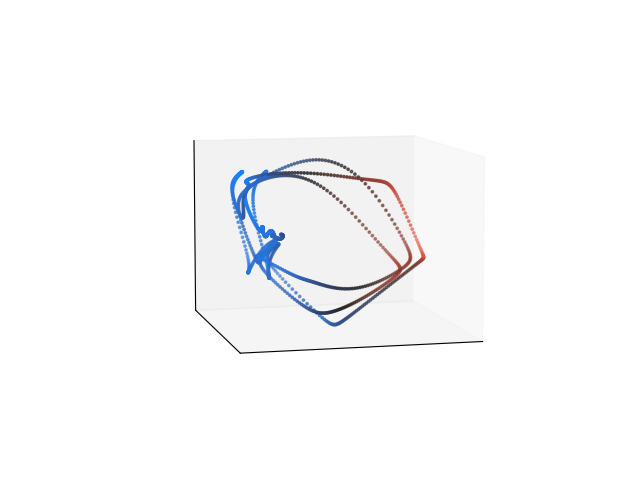

117/117 [==============================] - 0s 1ms/step


In [109]:
fig = plt.figure()

#
y_plot = encoder.predict(xtest)[0]
lim = 1500
#colors1 = np.linspace(0,1,lim)
colors1 = colors[:lim,0]
#colors1 = np.arctan2(colors[:lim,0],colors[:lim,1])

ax0 = fig.add_subplot(projection='3d')
ax0.scatter(y_plot[:lim,0],y_plot[:lim,1],y_plot[:lim,2],s=3,c=colors1,cmap=cc.cm["CET_D4"])
ax0.set_xticks([])
ax0.set_yticks([])
ax0.set_zticks([])
ax0.view_init(42,133)

<IPython.core.display.Javascript object>


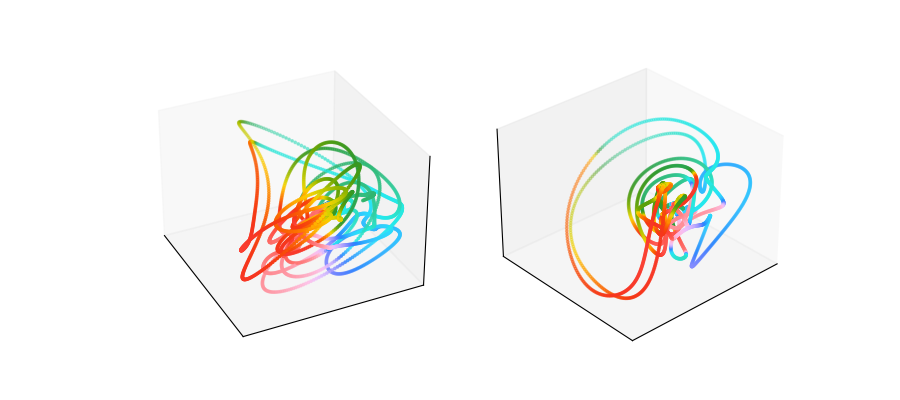

117/117 [==============================] - 0s 1ms/step


In [298]:
lim = y_plot.shape[0]
colors1 = np.arctan2(colors[:,2],colors[:,1])

fig = plt.figure(figsize=(9,4))

#
ax0 = fig.add_subplot(1, 2, 1, projection='3d')
ax0.scatter(y_plot[:lim,0],y_plot[:lim,1],y_plot[:lim,2],s=3,c=colors1[:lim],cmap=cc.cm["CET_C6"])
ax0.set_xticks([])
ax0.set_yticks([])
ax0.set_zticks([])
ax0.view_init(42,133)

#
utestu = encoder.predict(xtest)[0]
#utestu = yhat_plot.copy()
#utestu,_,_ = np.linalg.svd(utest, full_matrices=False)
ax1 = fig.add_subplot(1, 2, 2, projection='3d')
ax1.scatter(utestu[:lim,2],utestu[:lim,0],utestu[:lim,1],s=3,c=colors1[:lim],cmap=cc.cm["CET_C6"])
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_zticks([])
ax1.view_init(38,-138)

plt.subplots_adjust(wspace=0, hspace=0)


plt.show()


In [230]:
[ax1.elev,ax1.azim]

[37.88311688311677, -138.2987012987018]

<IPython.core.display.Javascript object>


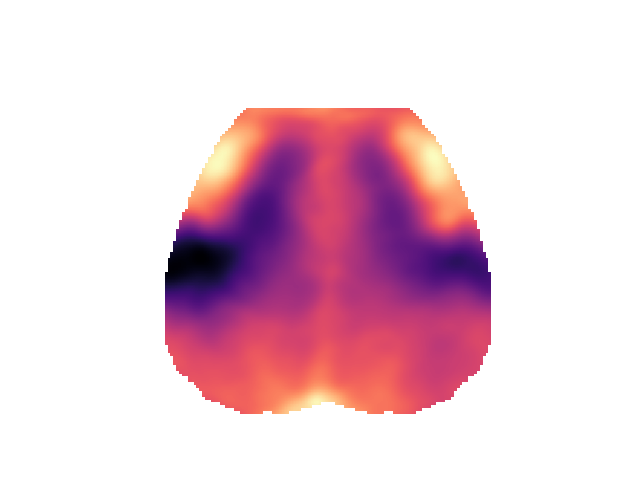

In [116]:
#temp = ytest.T@embedding.embedding_[nsamples2:-lag,1]
temp = ytest.T@embedding.embedding_[:,2]
#temp = vh[0,:]

outmat1 = np.zeros((16384,), dtype=np.single)
outmat1[mask_long] = temp
outmat1 = np.ma.masked_where(outmat1==0, outmat1)
outmat1 = outmat1.reshape(128,128,order='F')

plt.figure()
plt.imshow(outmat1,cmap='magma')
plt.axis('off')
plt.show()

In [19]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=6, random_state=0).fit(StandardScaler().fit_transform(yproj))
colors = kmeans.labels_
#colors = kmeans.labels_[nsamples2:-lag]
#colors = face[spacing*(stackmax-1)+nsamples2+lag:]

<IPython.core.display.Javascript object>


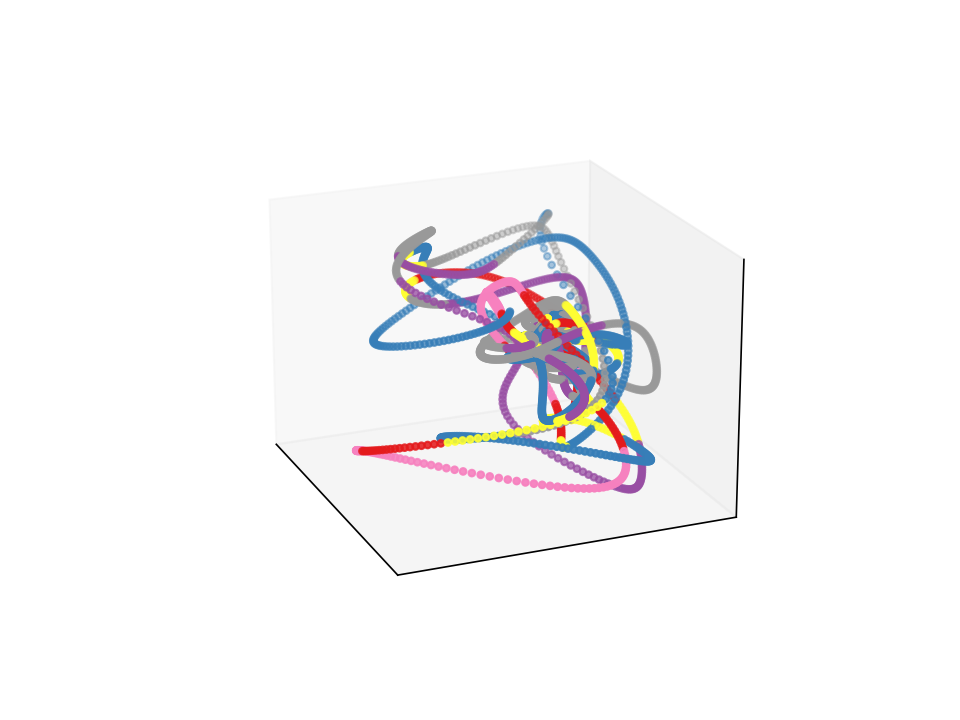

117/117 [==============================] - 0s 3ms/step


In [23]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
lim = ytest.shape[0]
#utest = ytest_hat#(np.diag(Hps[:r])@Hpvh[:r,lag+nsamples2:]).transpose()
utest,_,_ = encoder.predict(xtest)
ax.scatter(utest[:lim,3],utest[:lim,4],utest[:lim,5],s=40,marker ='.',c=colors[:lim],cmap='Set1')
#ax.scatter(utest[:lim,0],utest[:lim,1],utest[:lim,2],s=40,marker='.',c=colors[:lim],cmap='plasma')
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
#plt.axis('off')

#ax.view_init(39,31) #0,1,2 view
ax.view_init(31,39) #0,1,3 view

plt.show()

In [134]:
def plot_test_performance(X,y,y_hat,xlabel=None,ylabel = None,names = None):
    
    classes = np.unique(states)
    num_classes = len(classes)
    
    # 
    prop_cycle = plt.rcParams['axes.prop_cycle']
    color = prop_cycle.by_key()['color']
    
    fig,ax = plt.subplots(figsize = (4,4))
    for ii,cl in enumerate(classes):
        if names is not None: # If 'names' was passed, use this for label
            this_label = names[ii]
        else:
            this_label = str(cl) # If 'names' was passed, otherwise use class number
        
        # Determine which points were correct (or not)
        is_class = y == cl
        is_correct = y == y_hat
        
        # Plot correctness with labels
        ax.scatter(X[is_class & is_correct,0],X[is_class & is_correct,1],c=color[cl],edgecolor='none',label = this_label + ' correct')
        ax.scatter(X[is_class & ~is_correct,0],X[is_class & ~is_correct,1],c='none',edgecolor=color[cl],label =this_label + ' incorrect')
        
    ax.set_xlim(X[:,0].min(),X[:,0].max())
    ax.set_ylim(X[:,1].min(),X[:,1].max())
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend()
    plt.show()

In [302]:
from sklearn.cluster import KMeans,SpectralClustering
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.neighbors import KNeighborsClassifier

#kmeans = KMeans(n_clusters=6,random_state=0).fit(yproj)
#states = kmeans.labels_

#classifier = KNeighborsClassifier(n_neighbors=200)
classifier = LDA()
r = 4
#ytrain_hat = encoder.predict(xtrain)[0]
ytrain_hat = model.predict(xtrain)@vh.T[:,:r]
classifier.fit(ytrain_hat,states[:ytrain_hat.shape[0]])

#states_hat = classifier.predict(encoder.predict(xtest)[0])
states_hat = classifier.predict(model.predict(xtest)@vh.T[:,:r])

#classifier.score(encoder.predict(xtest)[0],states[-ytest_hat.shape[0]:])
classifier.score(model.predict(xtest)@vh.T[:,:r],states[-ytest_hat.shape[0]:])
#classifier.explained_variance_ratio_


0.2930432446951383

117/117 [==============================] - 0s 1ms/step


<IPython.core.display.Javascript object>


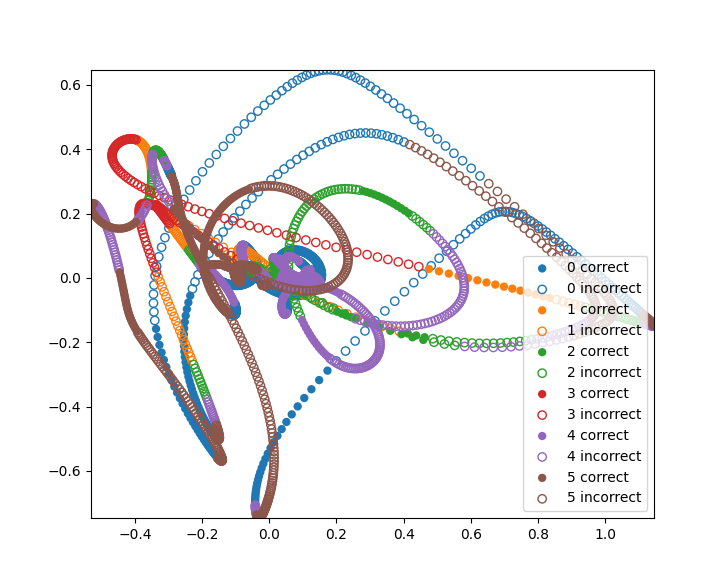

In [172]:
plot_test_performance(encoder.predict(xtest)[0],states[-ytest_hat.shape[0]:],states_hat)

<IPython.core.display.Javascript object>


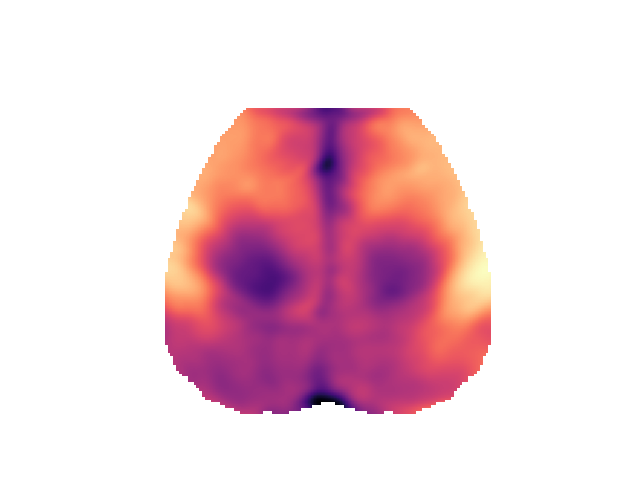

In [105]:
#temp = ytest.T@embedding.embedding_[nsamples2:-lag,1]
#temp = yproj.T@embedding.embedding_[:,1]
#temp = vh[0,:]

temp = np.mean(ytest[colors==5,:],axis=0)

outmat1 = np.zeros((16384,), dtype=np.single)
outmat1[mask_long] = temp
outmat1 = np.ma.masked_where(outmat1==0, outmat1)
outmat1 = outmat1.reshape(128,128,order='F')

plt.figure()
plt.imshow(outmat1,cmap='magma')
plt.axis('off')
plt.show()

# DYNAMICS

In [817]:
## DYNAMICS

dt = .05
r_d = 3
#t = np.arange(0, y.shape[0], dt)
#tspan = (t[0],t_train[-1])

# LASSO
lasso_optimizer = Lasso(alpha=.00002, max_iter=1000, fit_intercept=False)
athresh = .98
bthresh = 2.83757971
cthresh = 6.9
thresholds = np.tile(np.array([athresh, bthresh, cthresh]),(56,1))
thresholds[0,:] = 10

# Instantiate and fit the SINDy model
model = ps.SINDy(
    optimizer=ps.STLSQ(threshold=.033),
    #optimizer=ps.SR3(thresholds=thresholds, thresholder = 'weighted_l0'),
    #optimizer=lasso_optimizer,
    differentiation_method=ps.SmoothedFiniteDifference(drop_endpoints=True),
    feature_library=ps.PolynomialLibrary(degree=5),
    #feature_names=["v1", "v2", "v3"]
)
#temp,_ = scaler2((np.diag(Hps[:r_d])*(1/np.sum(Hps))@Hpvh[:r_d,:]).T)
#temp,_ = scaler2(Hpvh[:r_d,:].T)
temp = Hpvh[:r_d,:].T
model.fit(temp, t=dt, ensemble=True, library_ensemble=False)
#temp,_,_ = encoder.predict(xtrain)
#model.fit(temp, t=dt)
model.print()

(x0)' = -0.136 x1
(x1)' = 0.149 x0 + -0.147 x2
(x2)' = 0.013 x1 + -0.084 x2 + -10.506 x0 x1


In [818]:
dt = .05
t = np.arange(0, dt*len(2*temp), dt)
x0 = temp[1000,:r_d]
x_sim = model.simulate(x0, t)

<IPython.core.display.Javascript object>


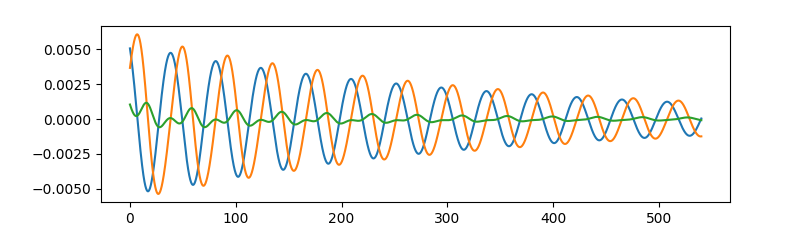

In [819]:
fig, ax = plt.subplots()
#plt.plot(t,temp[:,:2])
plt.plot(t,x_sim[:,:])
plt.xlabel("time (s)")
plt.show()

<IPython.core.display.Javascript object>


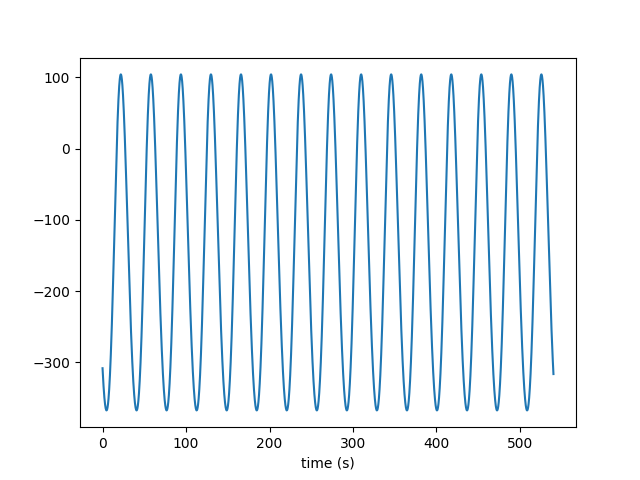

In [816]:
#pupil_sim = x_sim@(Hpu[0,:r_d].T)
pupil_sim = x_sim@np.diag(Hps[:r_d])@(Hpu[0,:r_d].T)


fig,ax = plt.subplots()
#plt.plot(t,.0001*pupil[lag+spacing*(stackmax-1):nsamples+spacing*(stackmax-1)])
plt.plot(t,pupil_sim)
plt.xlabel("time (s)")
plt.show()

In [778]:
#temp,_,_ = encoder.predict(x_sim)
temp = decoder.predict(x_sim)

fig,ax = plt.subplots()
plt.plot(t,ytrain[:,0])
plt.plot(t,temp[:,0])
plt.xlabel("time (s)")
plt.show()

NameError: name 'decoder' is not defined

In [821]:
np.save('xtrain_pupil', temp)
#temp,_,_ = encoder.predict(xtest)
#np.save('xtrain_pupil', temp)

<IPython.core.display.Javascript object>


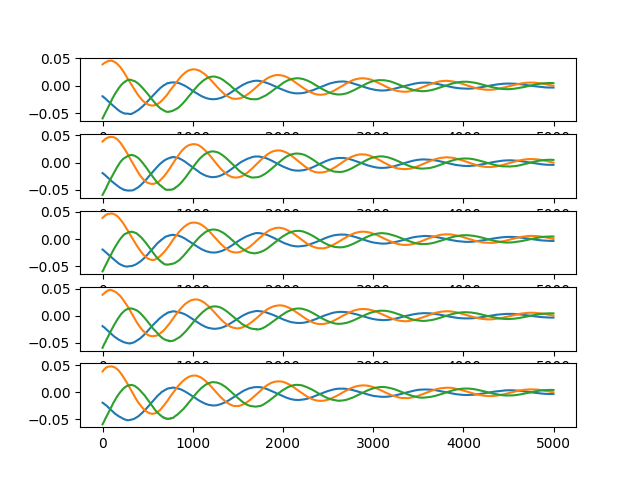

In [831]:
#np.save('xtrain_pupil', xtest[:,:3])
#temp,_,_ = encoder.predict(xtest)
#np.save('xtrain_pupil', temp)
temp = np.load('ztraj_200.npy')

fig, axes = plt.subplots(5,1,sharex='row')
for i, ax in enumerate(axes):
    #a,_ = scale_x.inverse_transform(temp[i,:,:])
    #ax.plot(a)
    ax.plot(temp[i,:,:])
    
plt.show()

<IPython.core.display.Javascript object>


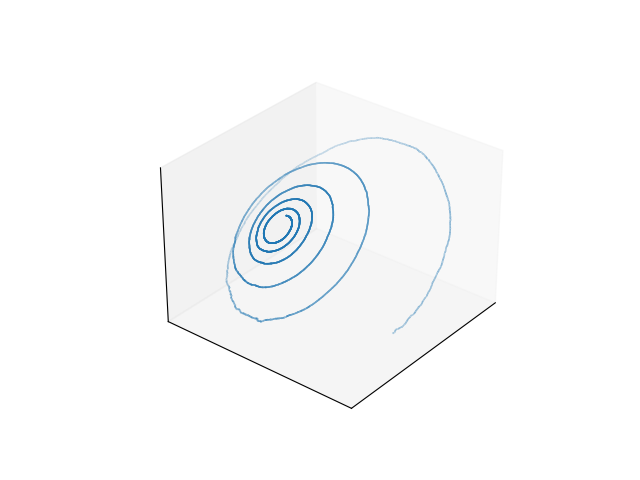

In [832]:
temp1 = temp[-1,:,:]

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
lim = temp1.shape[0]
#temp1 = signal.sosfiltfilt(sos, temp1, axis = 0)
ax.scatter(temp1[:lim,0],temp1[:lim,1],temp1[:lim,2],s=.1,marker ='.')
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
#plt.axis('off')

ax.view_init(31,39) #0,1,3 view

plt.show()

<IPython.core.display.Javascript object>


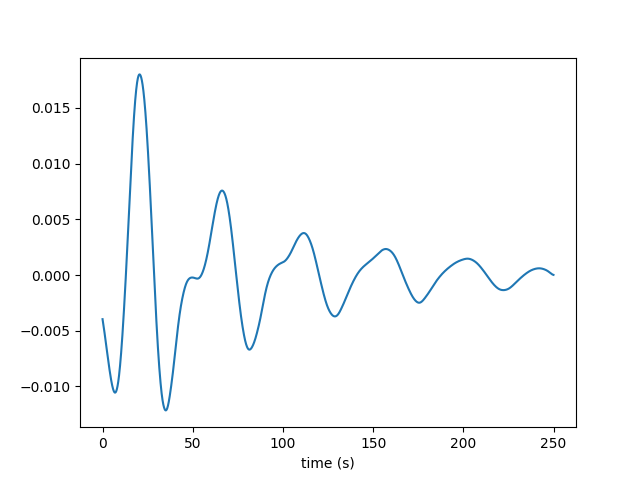

In [833]:
x_sim = model.predict(temp[-1,:])
pupil_sim = x_sim@(Hpu[0,:r_d].T)
sos = signal.butter(2, [.02,.2],btype = 'bandpass', output = 'sos', fs = Fs)
pupil_sim = signal.sosfiltfilt(sos, pupil_sim, axis = 0)

fig,ax = plt.subplots()
#plt.plot(t,.0001*pupil[lag+spacing*(stackmax-1):nsamples+spacing*(stackmax-1)])
plt.plot(.05*np.arange(len(pupil_sim)),10*pupil_sim)
plt.xlabel("time (s)")
plt.show()

# MOVIE

In [81]:
#data1 = temp
data1 = ytest.copy()
data2 = ytest_hat.copy()

# project back
outmat1 = np.zeros((data1.shape[0],16384), dtype=np.single)
#outmat1[:,mask_long] = StandardScaler(with_std=False).fit_transform(outmat1[:,mask_long])
outmat1[:,mask_long] = StandardScaler(with_std=False).fit_transform(data1)
outmat1 = np.ma.masked_where(outmat1==0, outmat1)
outmat1 = outmat1.reshape(data1.shape[0],128,128,order='F')

outmat2 = np.zeros((data2.shape[0],16384), dtype=np.single)
outmat2[:,mask_long] = StandardScaler(with_std=False).fit_transform(data2)
outmat2 = np.ma.masked_where(outmat2==0, outmat2)
outmat2 = outmat2.reshape(data2.shape[0],128,128,order='F')

In [ ]:
def plot_allen_ccf():
    #allen_ccf1 = [np.where(arr > 128, arr, np.nan) for arr in allen_ccf]
    for i in range(len(allen_ccf)):
        plt.plot(allen_ccf[i][:,0],allen_ccf[i][:,1],'w')

In [ ]:
from scipy.ndimage import binary_dilation
from scipy.ndimage import gaussian_filter

temp = mask.astype(int)
temp = signal.medfilt2d(temp,3)
#temp = zoom(temp,3)
#temp = gaussian_filter(temp,sigma=5)
temp = binary_dilation(temp,iterations=5) - temp
#temp = gaussian_filter(temp,sigma=1) - temp

#temp = np.ma.masked_where(temp<.01, temp)


plt.figure()
plt.imshow(temp)
plt.show()

<IPython.core.display.Javascript object>


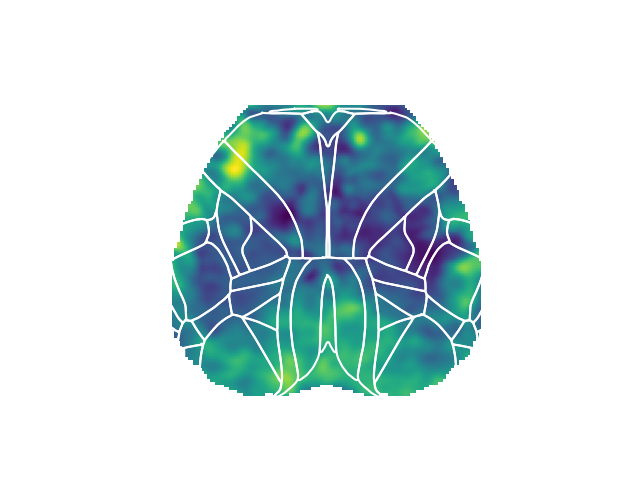

In [200]:
from scipy.ndimage import zoom
plt.figure()
plt.imshow(outmat1[80,:,:], cmap='viridis')
plot_allen_ccf()
#plt.imshow(temp)
plt.axis('off')
plt.show()

<IPython.core.display.Javascript object>


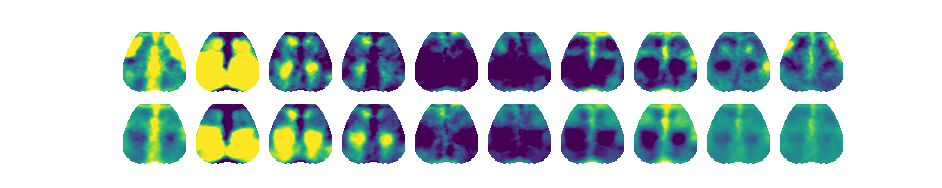

In [15]:
nframes = 10
step = 80 #60
offset = 2179 #100

fig, axes = plt.subplots(2,nframes,sharex='col',figsize=(9.42,1.88))

c1 = .004
c2 = c1


cmap = cm.get_cmap('viridis').copy()
#cmap.set_bad(color='black')

axes = axes.flatten()
for i, ax in enumerate(axes):
    
    if i<nframes:
        ax.imshow(outmat1[i*step + offset,:,:], vmin=-c1, vmax=c1, cmap = cmap)
        
    else:
        ax.imshow(outmat2[(i-nframes)*step + offset,:,:], vmin=-c2, vmax=c2, cmap = cmap)    

    ax.axis('off')
    
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

#plt.savefig('figure.png', transparent=True)

<IPython.core.display.Javascript object>


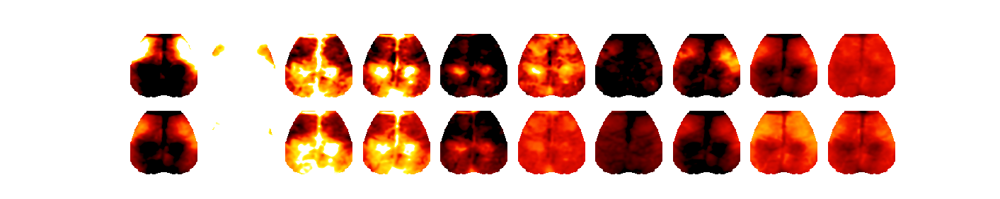

In [56]:
nframes = 10
step = 80
offset = 2179

fig, axes = plt.subplots(2,nframes,sharex='col',figsize=(9.42,1.88))

c1 = .000003
c2 = c1

#cmap = cm.get_cmap('cividis').copy()
cmap = cc.cm.CET_L3
#cmap.set_bad(color='black')

axes = axes.flatten()
for i, ax in enumerate(axes):
    
    if i<8:
        ax.imshow(outmat1[i*step + offset,:,:], vmin=-c1, vmax=c1, cmap = cmap)
        
    else:
        ax.imshow(outmat2[(i-nframes)*step + offset,:,:], vmin=-c2, vmax=c2, cmap = cmap)    

    ax.axis('off')
    
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()


<IPython.core.display.Javascript object>


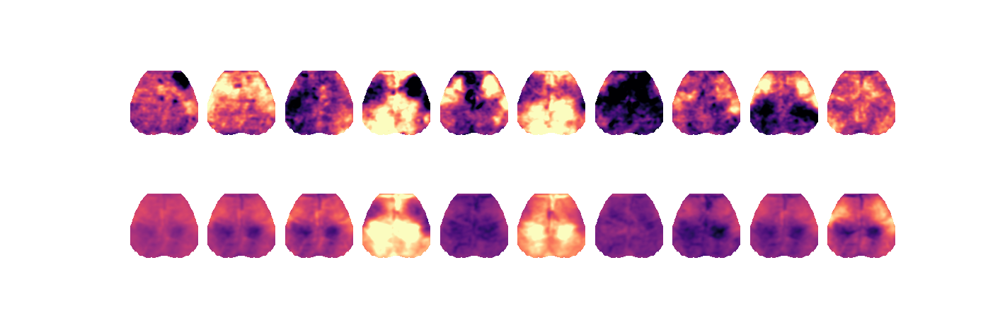

In [133]:
nframes = 10
step = 80
offset = 2179

fig, axes = plt.subplots(2,nframes,sharex='col',figsize=(9.42,3))

#c1 = .005
#c2 = .003

c1 = .007
c2 = c1

axes = axes.flatten()
for i, ax in enumerate(axes):
    
    if i<nframes:
        ax.imshow(outmat1[i*step + offset,:,:], vmin=-c1, vmax=c1, cmap = 'magma')
        
    else:
        ax.imshow(outmat2[(i-nframes)*step + offset,:,:], vmin=-c2, vmax=c2, cmap = 'magma')    

    ax.axis('off')
    
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()


<IPython.core.display.Javascript object>


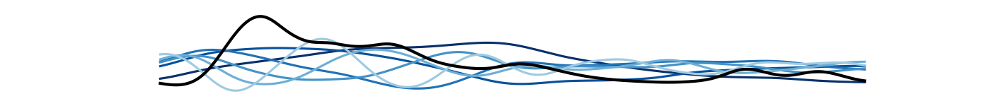

In [188]:
fig, axes = plt.subplots(figsize=(9.42,1))
#temp,_,_ = encoder.predict(xtest[offset:nframes*step+offset,:])
temp = xtest[offset:nframes*step+offset,:]
temp1 = .0005*pupil[(stackmax-1)*spacing + nsamples2:]
temp1 = temp1[offset:nframes*step+offset]

n = 6
colors = plt.cm.Blues_r(np.linspace(0,1,n+2))
for i in range(n):
    plt.plot(temp[:,i], lw=1.5, color=colors[i]) #'b', alpha=1-i/n)
    
plt.plot(temp1,'k',lw=2)
plt.axis('off')
plt.show()

In [83]:
start = 3000
stop = start+3000

tic()
u,s,vh = np.linalg.svd(brain[start:stop,:], full_matrices=False)
toc()

Elapsed time is 35.97131371498108 seconds.


<IPython.core.display.Javascript object>


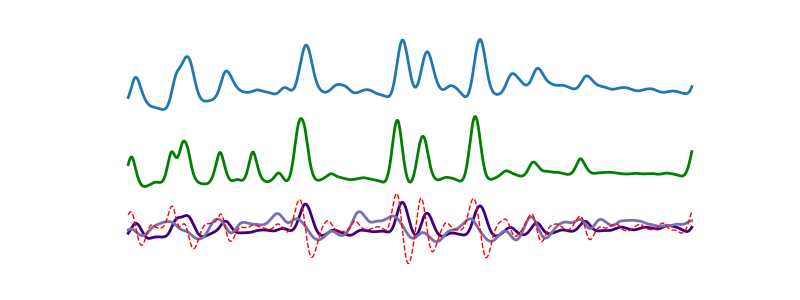

In [31]:
fig, axes = plt.subplots(3, 1, sharex='col', figsize=(8,3))

axes[0].plot(pupil[start:stop],lw=2)
axes[1].plot(face[start:stop],'g',lw=2)

n = 2
colors = plt.cm.Purples_r(np.linspace(0,1,n+2))
for i in range(n):
    axes[2].plot(u[:,i], lw=2, color=colors[i]) #*s[i]
    
axes[2].plot(50*np.diff(u[:,0]), '--r', lw=1)#color='r') #*s[i]


axes[0].axis('off')
axes[1].axis('off')
axes[2].axis('off')

plt.subplots_adjust(wspace=0, hspace=0)

plt.show()

In [78]:
stats.pearsonr(np.diff(u[:,0]),u[1:,1])

(0.5329520456417596, 9.755248184156099e-220)

<IPython.core.display.Javascript object>


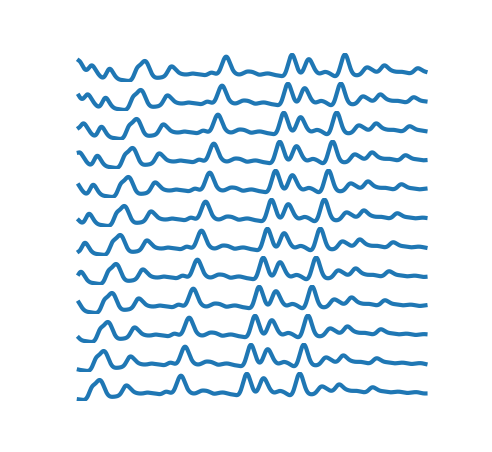

In [17]:
fig, axes = plt.subplots(12,1,sharex='col',figsize=(2.46,2.26),dpi=200)

axes = axes.flatten()
for i, ax in enumerate(axes):
    
    ax.plot(Hp[i*8,2800:5500])

    ax.axis('off')
    
plt.subplots_adjust(wspace=0, hspace=0)

plt.show()

<IPython.core.display.Javascript object>


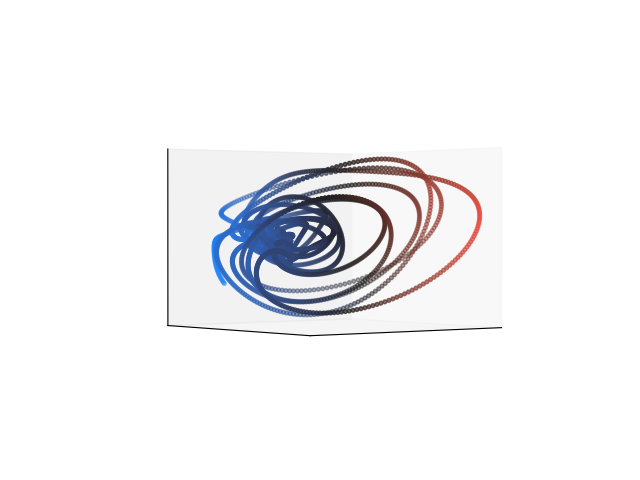

310/310 [==============================] - 0s 898us/step


In [69]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
start = 3000
stop = 8000
#temp = Hpvh.T
temp = encoder.predict(xtrain)[0]
colors = Hp[-1,:]#np.linspace(0,1,len(temp))
ax.scatter(temp[start:stop,0],temp[start:stop,1],temp[start:stop,2],s=30,marker ='.',c=colors[start:stop],cmap=cc.cm.CET_D4)
#ax.plot3D(temp[:lim,0],temp[:lim,1],temp[:lim,2],lw=3)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
#plt.axis('off')

ax.view_init(31,39) #0,1,3 view

plt.show()

<IPython.core.display.Javascript object>


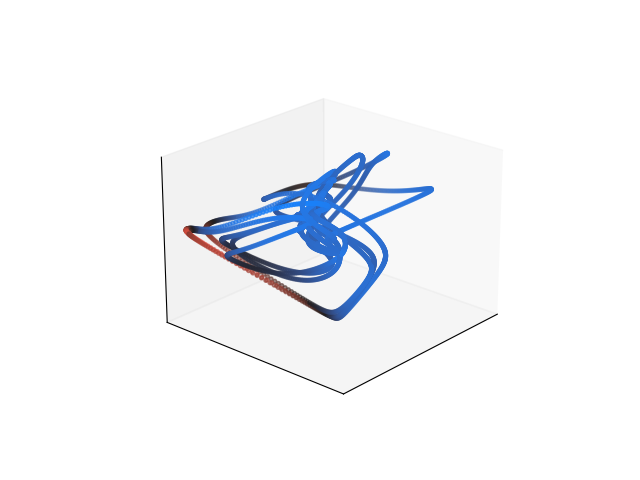

187/187 [==============================] - 0s 862us/step


In [336]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
start = 500
stop = 5000
#temp = Hpvh.T
temp = encoder.predict(xtrain)[0]
colors = Hp[-1,:]#np.linspace(0,1,len(temp))
ax.scatter(temp[start:stop,0],temp[start:stop,1],temp[start:stop,2],s=30,marker ='.',c=colors[start:stop],cmap=cc.cm.CET_D4)
#ax.plot3D(temp[:lim,0],temp[:lim,1],temp[:lim,2],lw=3)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
#plt.axis('off')

ax.view_init(31,39) #0,1,3 view

plt.show()

In [237]:
#plt.savefig('fad_recon.png', transparent=True, dpi=1200)
#plt.savefig('pupil_predictors.png', transparent=True, dpi=1200)
#plt.savefig('observables.png', transparent=True, dpi=300)
#plt.savefig('pupil_hankel.png', transparent=True, dpi=1200)
#plt.savefig('pupil_traj.png', transparent=True, dpi=300)
plt.savefig('clustering.png', transparent=True, dpi=300)

<IPython.core.display.Javascript object>


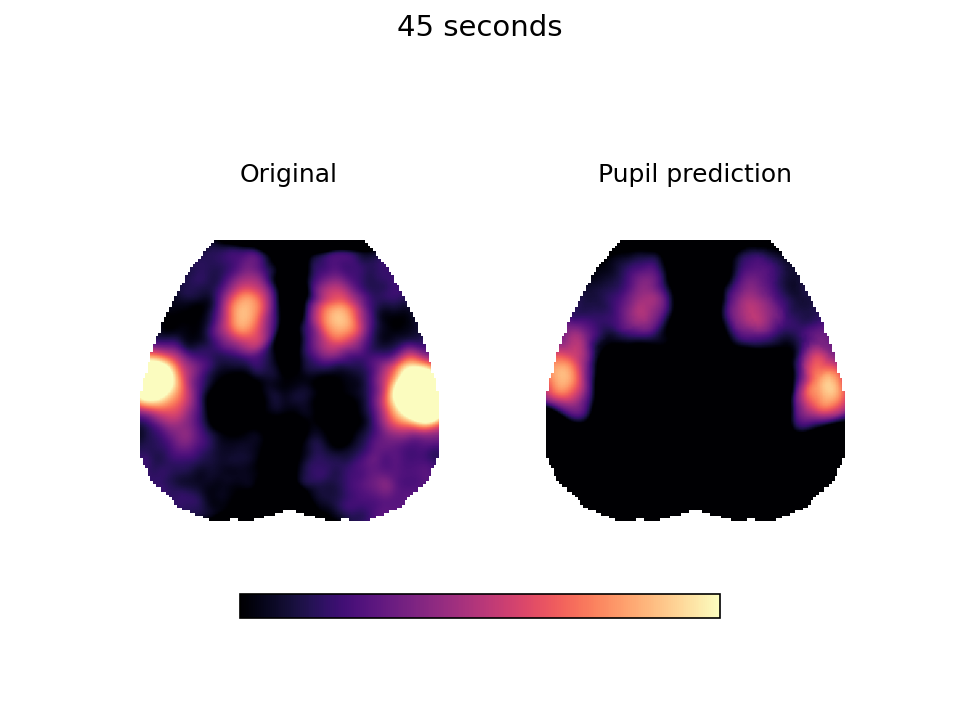

In [305]:
# MOVIE
## animate
c1 = .02015 #.002
c2 = c1/2
#plt.style.use("dark_background")
# %matplotlib qt
fig, (ax1, ax2) = plt.subplots(1,2)
im1 = ax1.imshow(outmat1[0,:,:], animated=True, vmin=-c1, vmax=c1, cmap = 'magma')
im2 = ax2.imshow(outmat2[0,:,:], animated=True, vmin=-c2, vmax=c2, cmap = 'magma')

ax1.axis('off')
ax2.axis('off')

cbar_ax = fig.add_axes([.25,.1,.5,.5])
cbar_ax.axis('off')
cbar = fig.colorbar(im1,ax=cbar_ax,orientation = "horizontal")
cbar.set_ticks([])

i = 0
def update(*args):
    global i
    if (i<outmat1.shape[0]):
        i += 1
    else:
        i=0
    im1.set_array(outmat1[i,:,:])
    im2.set_array(outmat2[i,:,:])
    ax1.title.set_text('Original')
    ax2.title.set_text('Pupil prediction')
    fig.suptitle(str(np.ceil(i*.05).astype(int)) + ' seconds', fontsize=14)

    return im1, im2,

ani = FuncAnimation(fig, update, blit=True, interval = 5, frames=3000) #5,3000

plt.show()

<IPython.core.display.Javascript object>


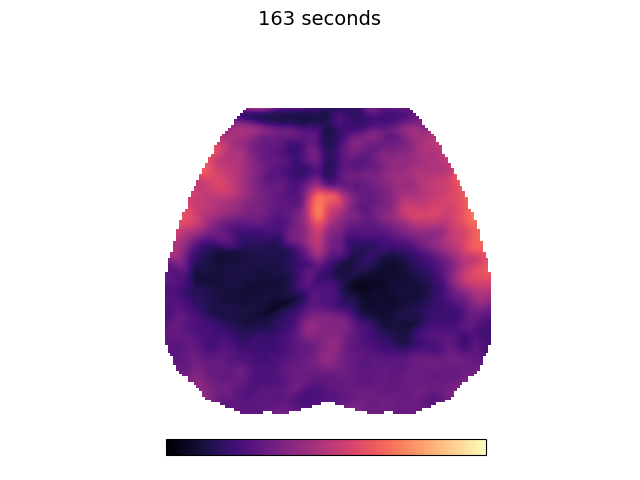

In [239]:
# MOVIE
## animate
c1 = .2
c2 = c1
#plt.style.use("dark_background")
# %matplotlib qt
fig, ax1 = plt.subplots()
im1 = ax1.imshow(outmat1[0,:,:], animated=True, vmin=-c1, vmax=c1, cmap = 'magma')

ax1.axis('off')

cbar_ax = fig.add_axes([.26,.01,.5,.5])
cbar_ax.axis('off')
cbar = fig.colorbar(im1,ax=cbar_ax,orientation = "horizontal")
cbar.set_ticks([])

i = 0
def update(*args):
    global i
    if (i<outmat1.shape[0]):
        i += 1
    else:
        i=0
    im1.set_array(outmat1[i,:,:])
    fig.suptitle(str(np.ceil(i*.05).astype(int)) + ' seconds', fontsize=14)

    return im1

ani = FuncAnimation(fig, update, blit=True, interval = 5, frames=1500) #5,3000

plt.show()

In [79]:
tic()
f = 'dmd_pupil_2.mp4'
writervideo = FFMpegWriter(fps=60)
ani.save(f, writer=writervideo)
toc()

Elapsed time is 47.437050104141235 seconds.


In [332]:
fig = plt.gcf()
fig_width, fig_height = plt.gcf().get_size_inches()
print(fig_width, fig_height)

9.42 1.88


<IPython.core.display.Javascript object>


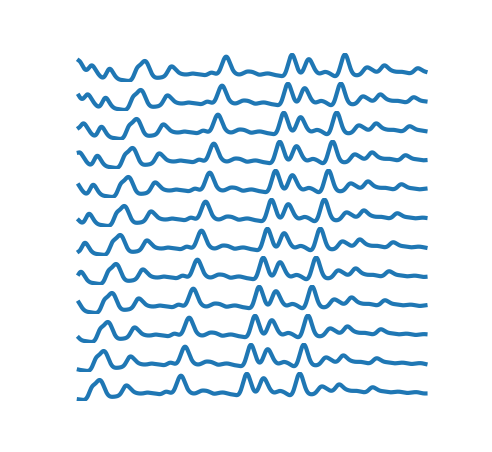

In [350]:
fig, axes = plt.subplots(12,1,sharex='col',figsize=(2.46,2.26),dpi=200)

axes = axes.flatten()
for i, ax in enumerate(axes):
    
    ax.plot(Hp[i*8,2800:5500])

    ax.axis('off')
    
plt.subplots_adjust(wspace=0, hspace=0)

plt.show()


In [349]:
fig = plt.gcf()
fig_width, fig_height = plt.gcf().get_size_inches()
print(fig_width, fig_height)

2.46 2.26


<IPython.core.display.Javascript object>


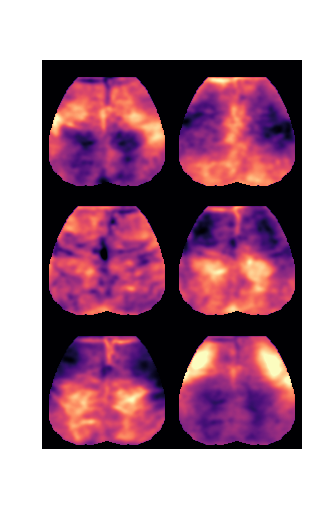

In [455]:
fig, axes = plt.subplots(3,2)

c1 = 1
axes = axes.flatten()

for i, ax in enumerate(axes):
        
    temp = np.mean(yproj[kmeans.labels_==i,:]@spatial_modes[:n,:],axis=0)
    temp = temp.reshape(-1,1)
    temp,_ = scaler(temp)
    outmat1 = np.zeros([16384,1], dtype=np.single)
    outmat1[mask_long] = temp
    outmat1[~mask_long] = -c1
    outmat1 = outmat1.reshape(128,128,order='F')
    
    ax.imshow(outmat1, vmin=-c1, vmax=c1, cmap = 'magma')


    ax.axis('off')
    
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

In [451]:
from deeptime.kernels import GaussianKernel
from deeptime.decomposition import KernelEDMD

X = ytest[:-1,:]#@spatial_modes[:n,:]
Y = ytest[1:,:]#@spatial_modes[:n,:]

sigma = 20 # kernel bandwidth
kernel = GaussianKernel(sigma)

n_eigs = 6 # number of eigenfunctions to be computed
kedmd_estimator = KernelEDMD(kernel, n_eigs=n_eigs, epsilon=1e-3)
kedmd_model = kedmd_estimator.fit((X, Y)).fetch_model()

phi = kedmd_model.transform(X)
#phi[:,1] = np.abs(phi[:,1])
#phi[:,2] = np.angle(phi[:,2])

# normalize
for i in range(n_eigs):
    phi[:, i] = phi[:, i] / np.max(np.abs(phi[:, i]))


<IPython.core.display.Javascript object>


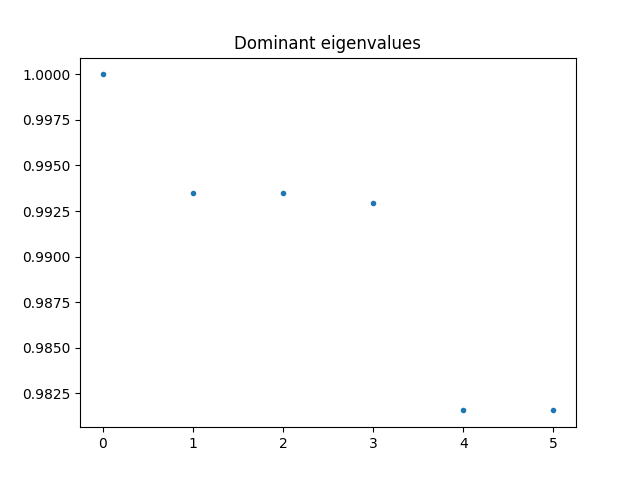

Text(0.5, 1.0, 'Dominant eigenvalues')

In [434]:
d = np.real(kedmd_model.eigenvalues)
plt.plot(d, '.')
plt.title('Dominant eigenvalues')

In [446]:
kedmd_model.eigenvectors.shape

(3722, 6)

<IPython.core.display.Javascript object>


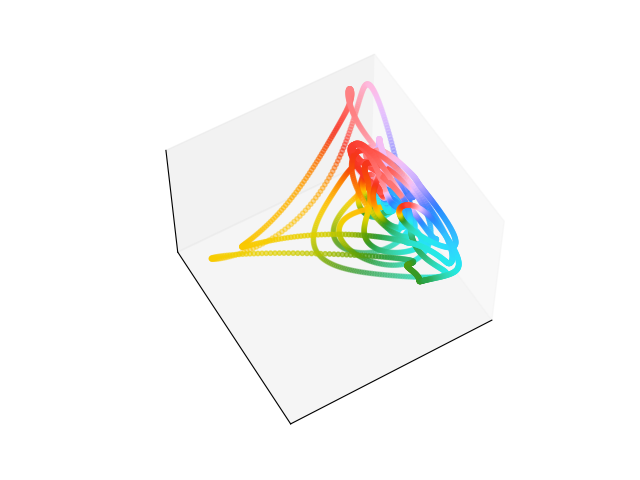

In [445]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
lim = X.shape[0]
colors = phi[:,2]
ax.scatter(X[:lim,0],X[:lim,1],X[:lim,2],s=40,marker ='.',c=colors[:lim],cmap=cc.cm.CET_C6)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

ax.view_init(31,39) #0,1,3 view

plt.show()

<IPython.core.display.Javascript object>


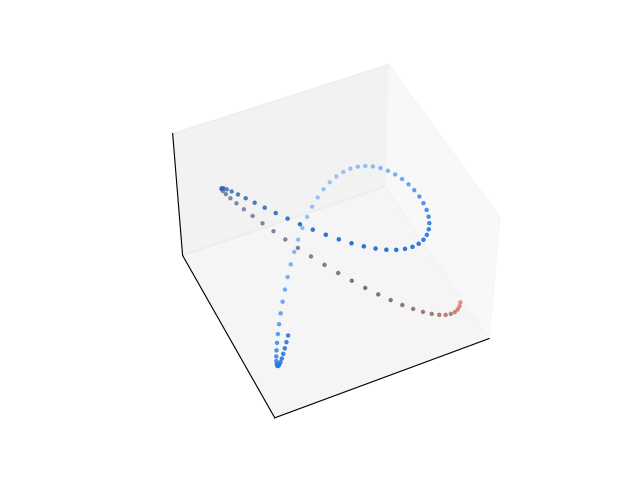

In [537]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
lim = 100
#colors = Hp[0,:lim].T
colors = yproj[:lim,0]
ax.scatter(Hpu[:lim,3],Hpu[:lim,4],Hpu[:lim,2],s=20,marker ='.',c=colors[:lim],cmap=cc.cm.CET_D4)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

ax.view_init(31,39) #0,1,3 view

plt.show()

<IPython.core.display.Javascript object>


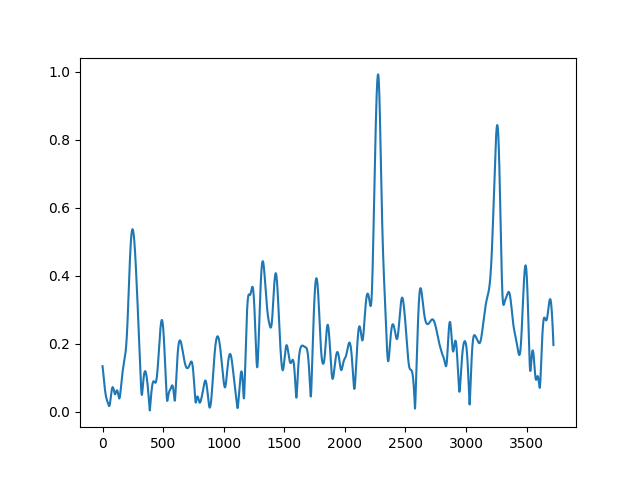

/home/ryraut/miniconda3/envs/swdb2022/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [437]:
fig, ax = plt.subplots()
plt.plot(-phi[:,0] * phi[:,1]*(np.exp(np.imag(phi[:,2]))))
plt.show()

In [ ]:
##

In [ ]:
import numpy as np
import cv2

def compute_optical_flow(prev_frame, next_frame):
    flow = cv2.calcOpticalFlowFarneback(prev_frame, next_frame, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    flow_x = flow[..., 0]
    flow_y = flow[..., 1]

    return flow_x, flow_y

def compute_flow_field(image_sequence):
    num_frames = len(image_sequence)
    flow_x = []
    flow_y = []

    for i in range(num_frames - 1):
        flow_x_i, flow_y_i = compute_optical_flow(image_sequence[i], image_sequence[i + 1])
        flow_x.append(flow_x_i)
        flow_y.append(flow_y_i)

    flow_x = np.array(flow_x)
    flow_y = np.array(flow_y)

    return flow_x, flow_y

def compute_leading_pc(flow_x, flow_y):
    num_frames, height, width = flow_x.shape

    # Reshape the flow field into a 2D array for PCA
    flow_x_flat = np.reshape(flow_x, (num_frames, height * width))
    flow_y_flat = np.reshape(flow_y, (num_frames, height * width))
    flow_flat = np.column_stack((flow_x_flat[:,mask_long], flow_y_flat[:,mask_long]))

    # Perform PCA
    u,s,vh = np.linalg.svd(flow_flat)
    leading_pc = vh[:,0]

    # Reshape the leading PC back to flow field shape
    temp = np.zeros((16384,), dtype=np.single)
    temp[mask_long] = np.reshape(leading_pc, (height, width))

    return temp

# Assuming image_sequence is a NumPy array of shape (num_frames, height, width)
flow_x, flow_y = compute_flow_field(outmat1[:10,:,:])
leading_pc = compute_leading_pc(flow_x, flow_y)


In [1]:
#outmat1 = np.zeros((16384,), dtype=np.single)
#outmat1[mask_long] = temp
#outmat1 = np.ma.masked_where(outmat1==0, outmat1)
#outmat1 = outmat1.reshape(128,128,order='F')

plt.figure()
plt.imshow(leading_pc,cmap='magma')
plt.axis('off')
plt.show()

NameError: name 'plt' is not defined

In [ ]:
leading_pc.shape